In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls /content/drive/My\Drive\/Grupo2SDR/

11b11M_2024-07-01T19_44_20_486.wav  11g9M_2024-07-01T19_45_23_361.wav
11b1M_2024-07-01T19_41_52_363.wav   11nMsc0_2024-07-01T19_49_53_440.wav
11b2M_2024-07-01T19_42_43_372.wav   11nMsc1_2024-07-01T19_50_24_776.wav
11b55M_2024-07-01T19_43_35_918.wav  11nMsc2_2024-07-01T19_50_44_990.wav
11g12M_2024-07-01T19_45_52_124.wav  11nMsc3_2024-07-01T19_51_03_436.wav
11g18M_2024-07-01T19_46_19_532.wav  11nMsc4_2024-07-01T19_51_22_989.wav
11g24M_2024-07-01T19_47_03_594.wav  11nMsc5_2024-07-01T19_51_43_900.wav
11g36M_2024-07-01T19_47_41_186.wav  11nMsc6_2024-07-01T19_52_23_150.wav
11g48M_2024-07-01T19_48_10_951.wav  11nMsc7_2024-07-01T19_52_42_967.wav
11g54M_2024-07-01T19_48_36_310.wav  ruido_2024-07-01T19_53_06_068.wav
11g6M_2024-07-01T19_44_52_773.wav


## Espectrogramas de señales 802.11b

<ipython-input-7-2a7a7b5ab878>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


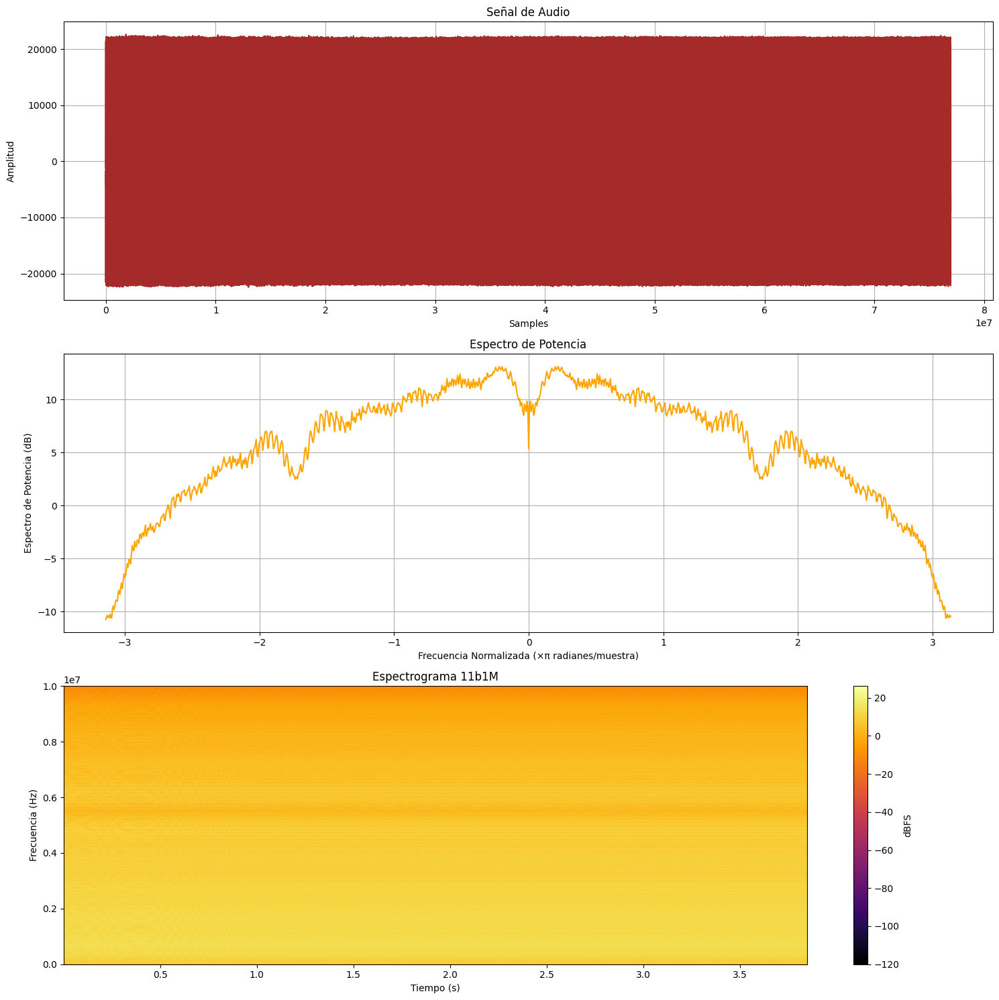

In [7]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11b1M_2024-07-01T19_41_52_363.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b1M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-9-65be9c202d64>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


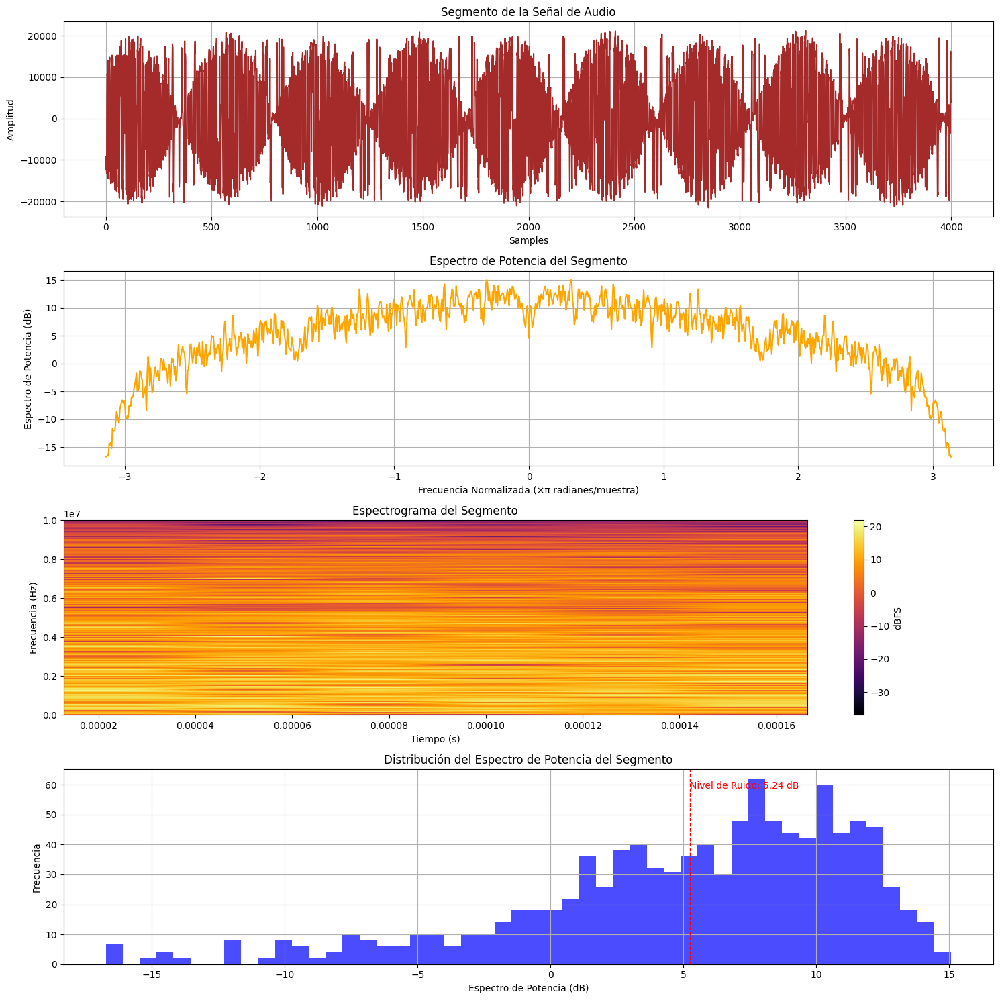

In [9]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11b1M_2024-07-01T19_41_52_363.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-10-5de8e1527e0b>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


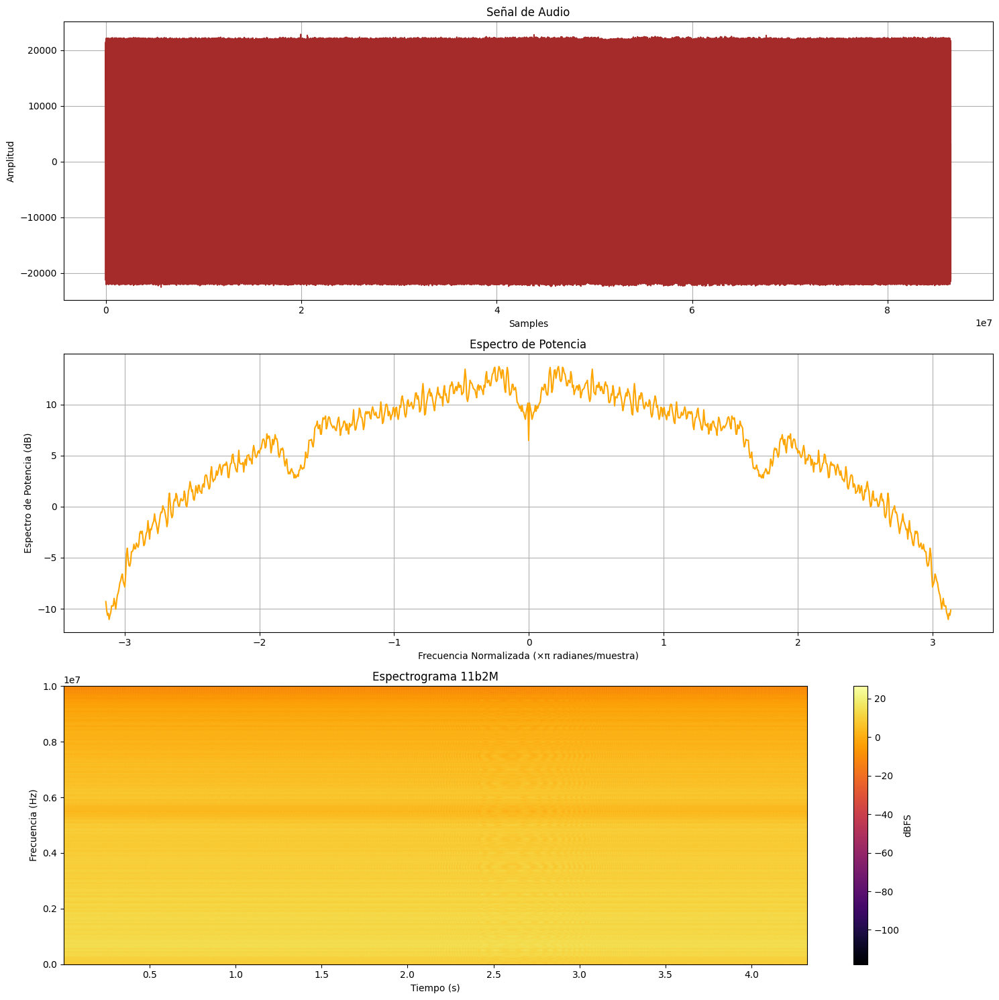

In [10]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11b2M_2024-07-01T19_42_43_372.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b2M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-11-05e3bcd85144>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


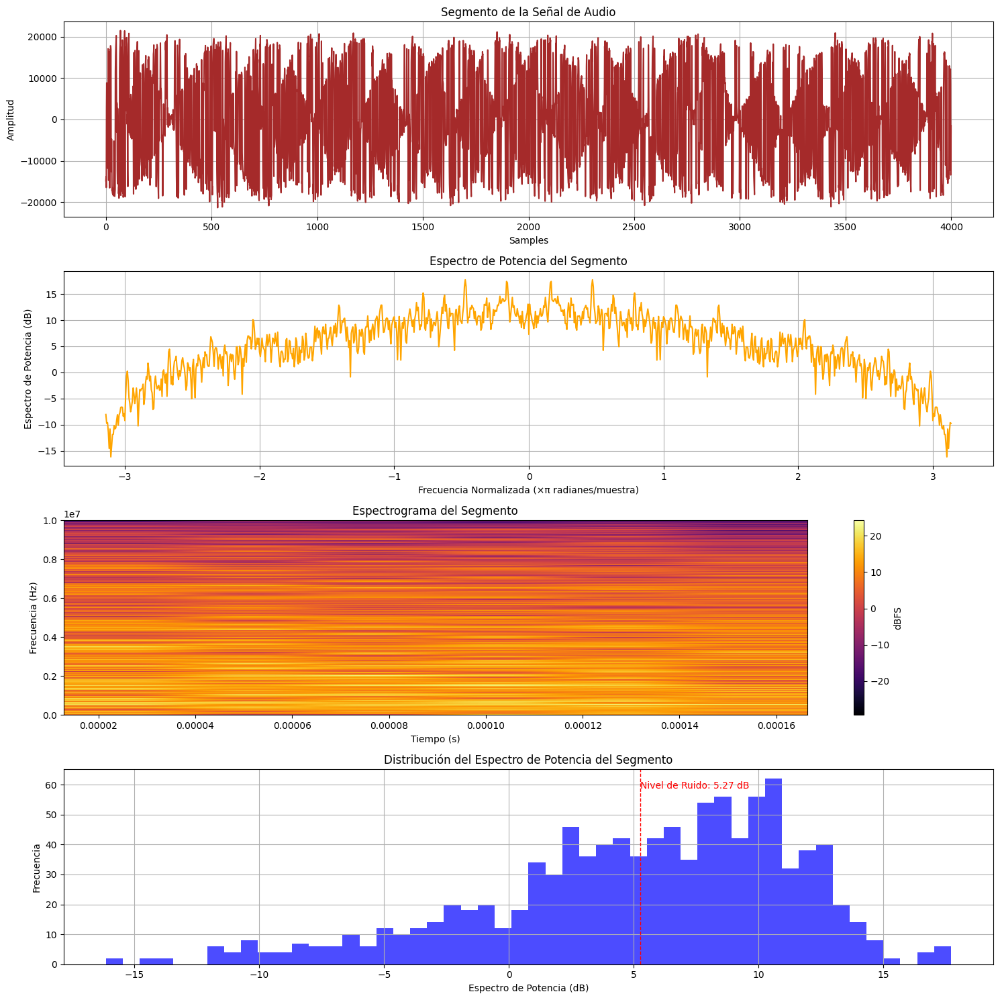

In [11]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11b2M_2024-07-01T19_42_43_372.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-12-c25b83880e78>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


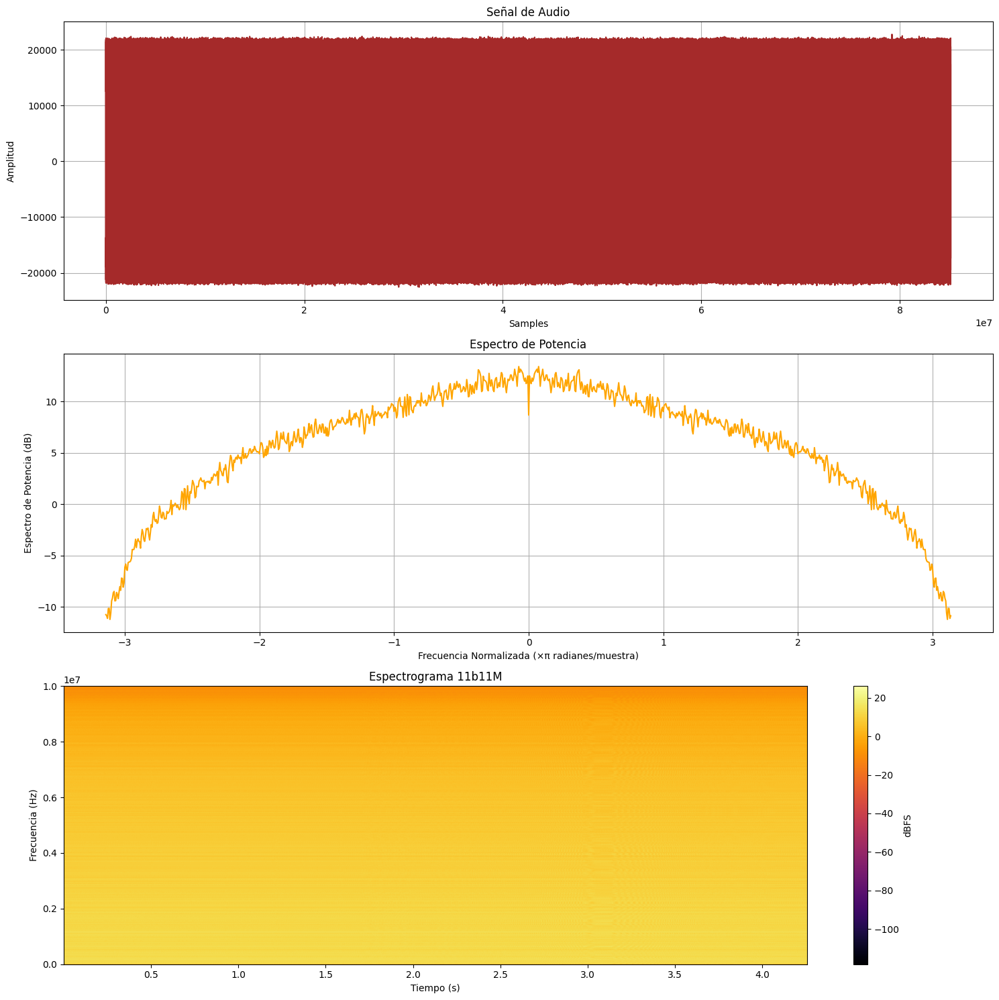

In [12]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11b11M_2024-07-01T19_44_20_486.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b11M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-13-37675a14b481>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


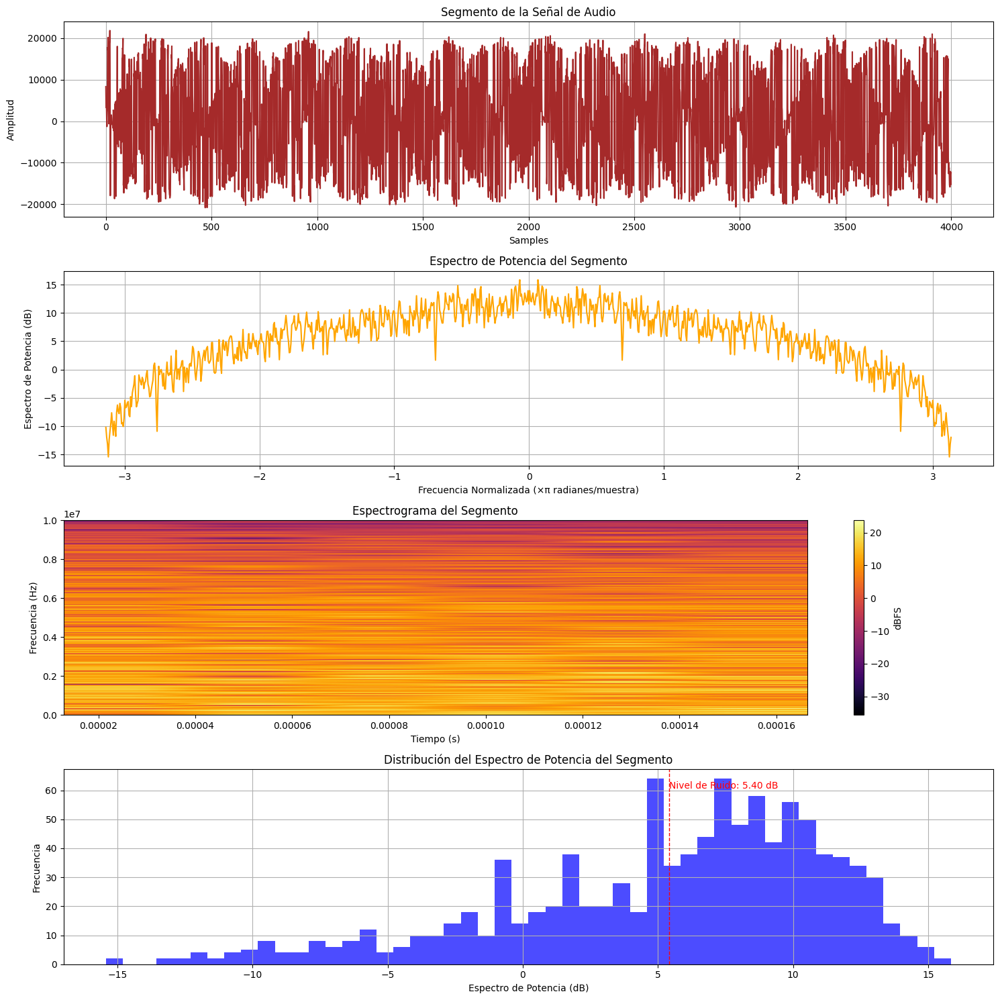

In [13]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11b11M_2024-07-01T19_44_20_486.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señal de ruido

<ipython-input-14-8390e5fa9d2f>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


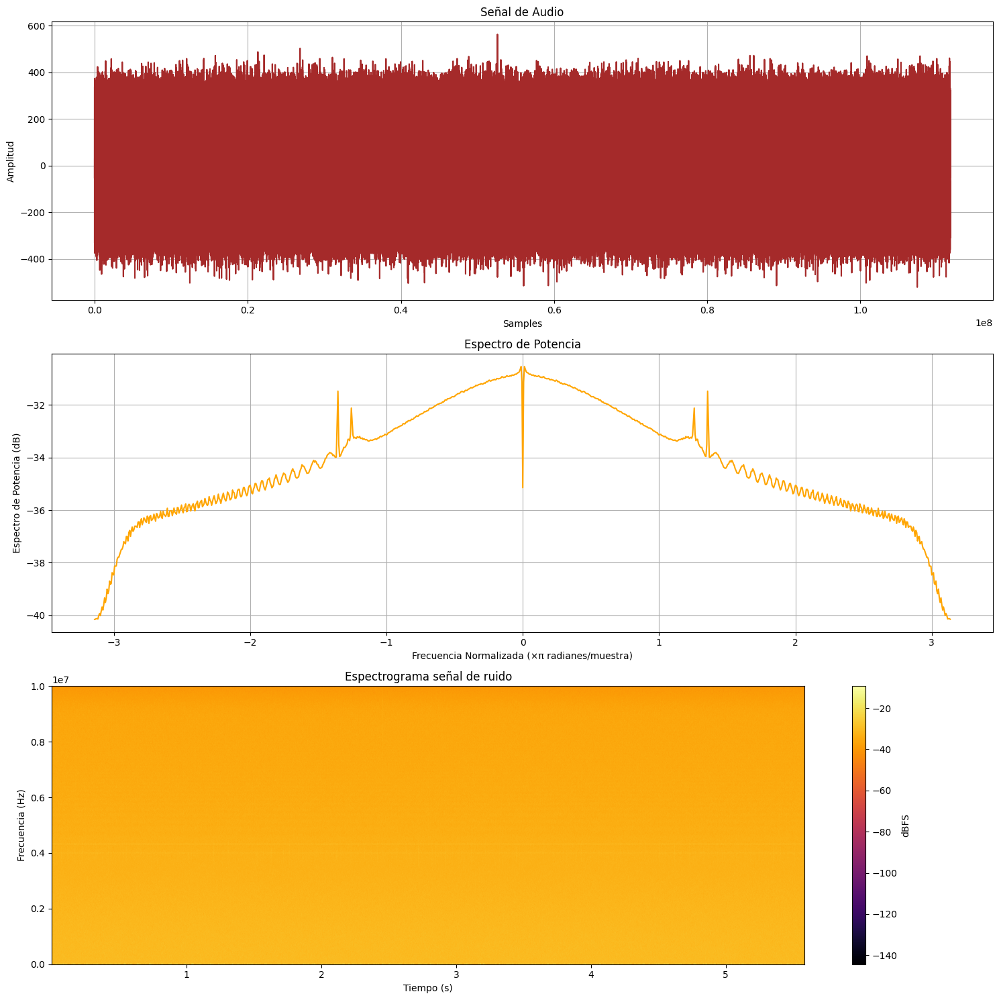

In [14]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/ruido_2024-07-01T19_53_06_068.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma señal de ruido')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-15-08074b2d54cd>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


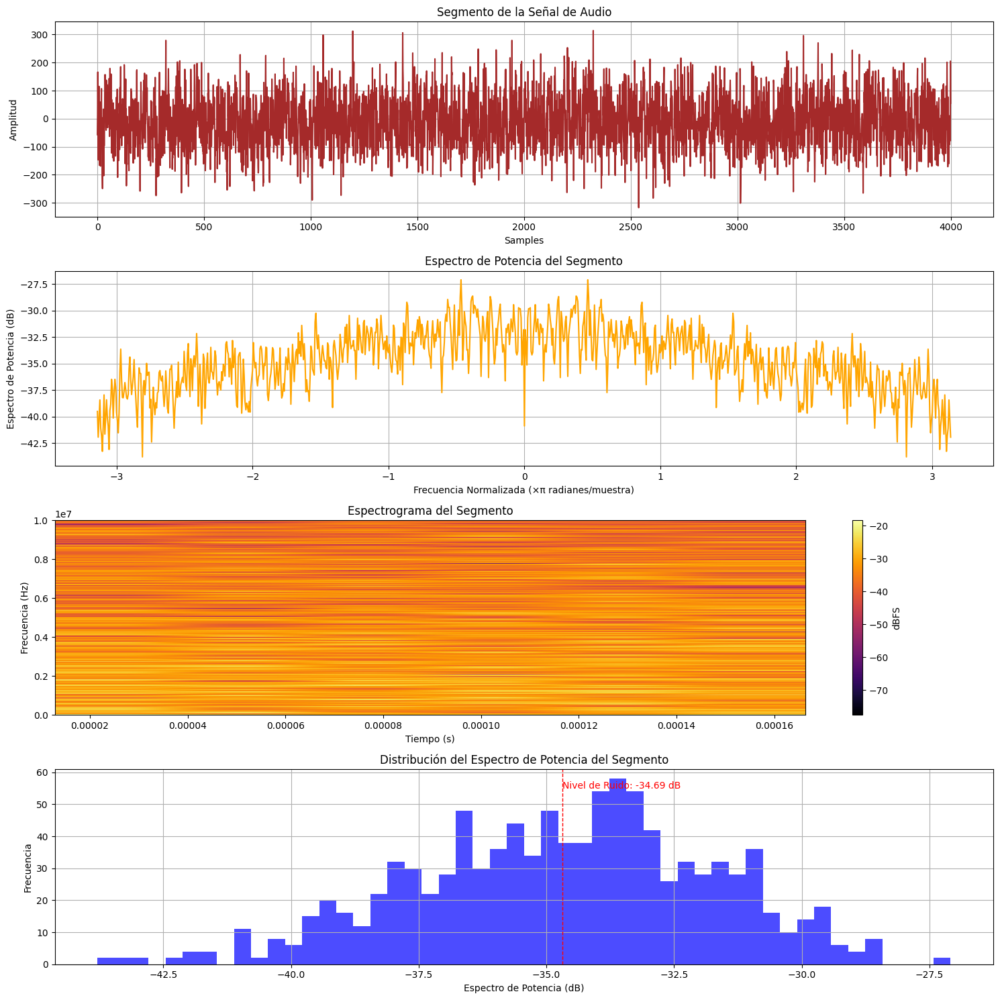

In [15]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/ruido_2024-07-01T19_53_06_068.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11n

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-17-69691de2835a>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


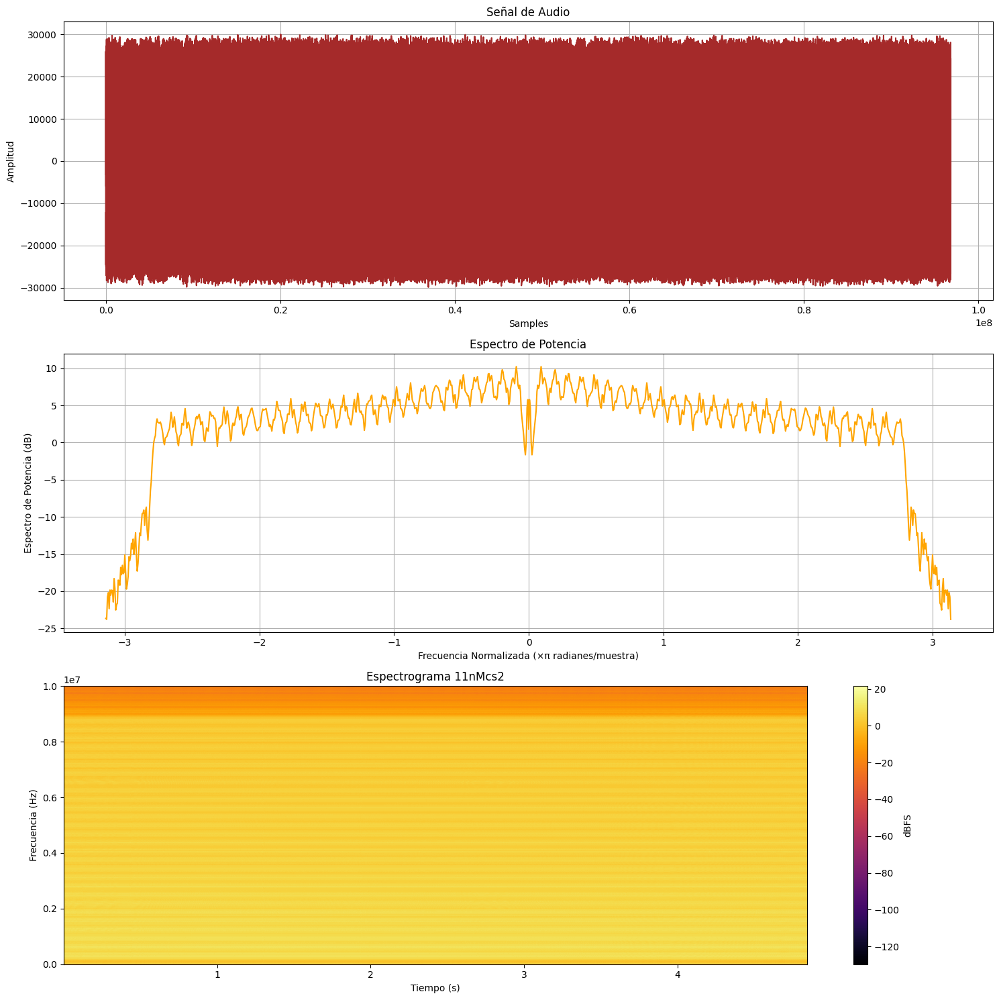

In [17]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc2_2024-07-01T19_50_44_990.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs2')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-18-364fb5a63231>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


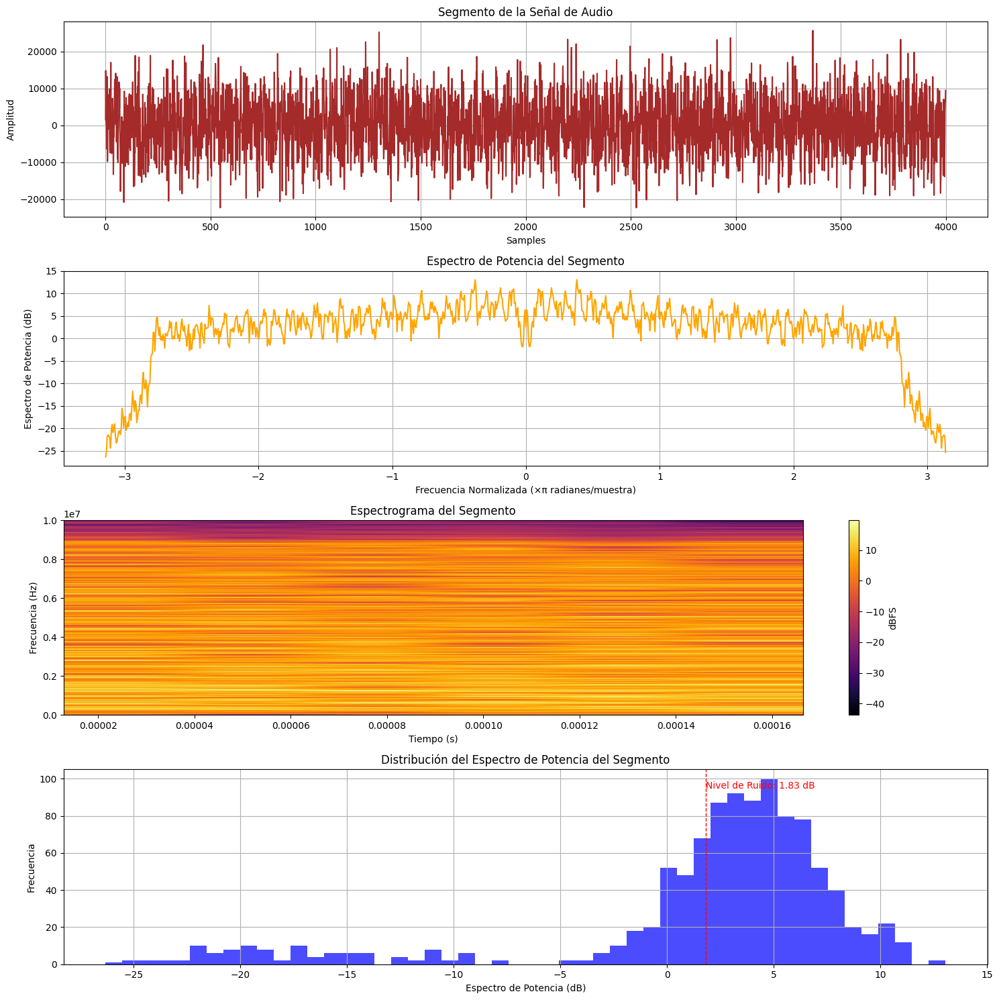

In [18]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc2_2024-07-01T19_50_44_990.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-19-e9fd8a9f9a45>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


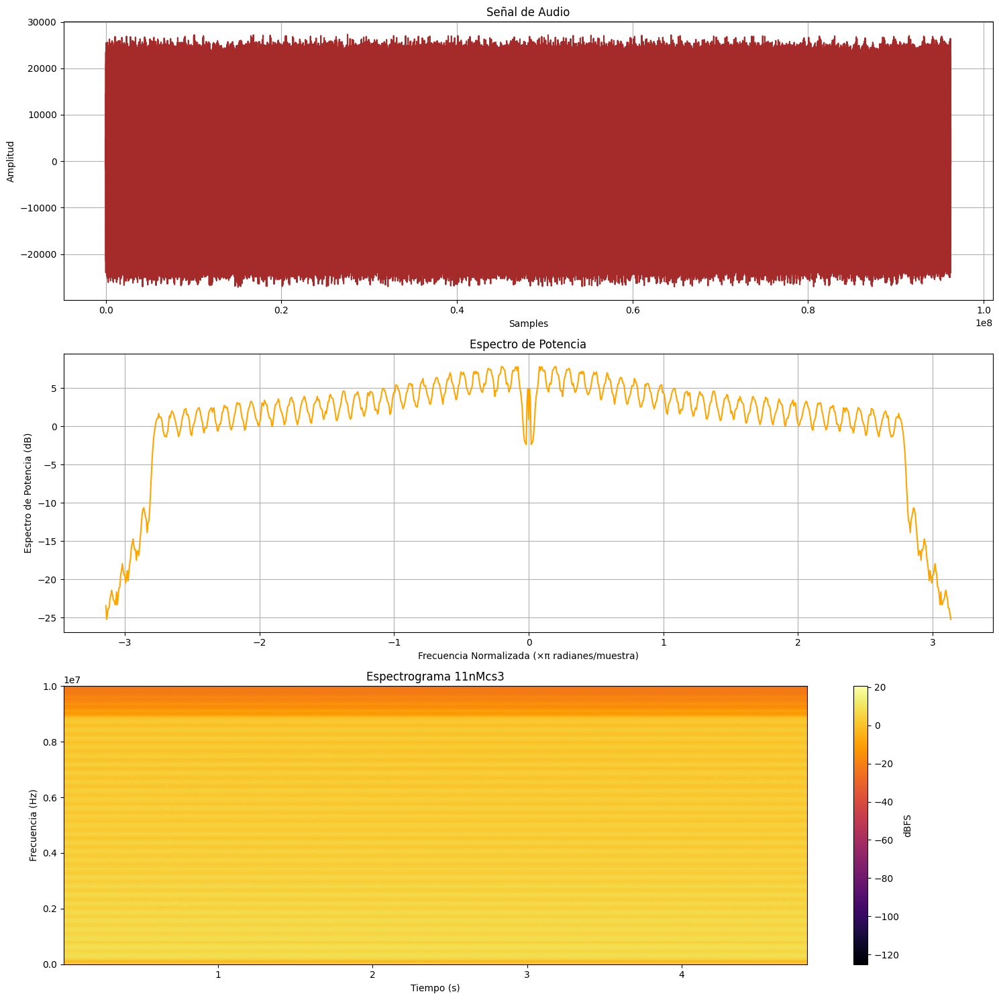

In [19]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc3_2024-07-01T19_51_03_436.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs3')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-20-81fe019dc8d7>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


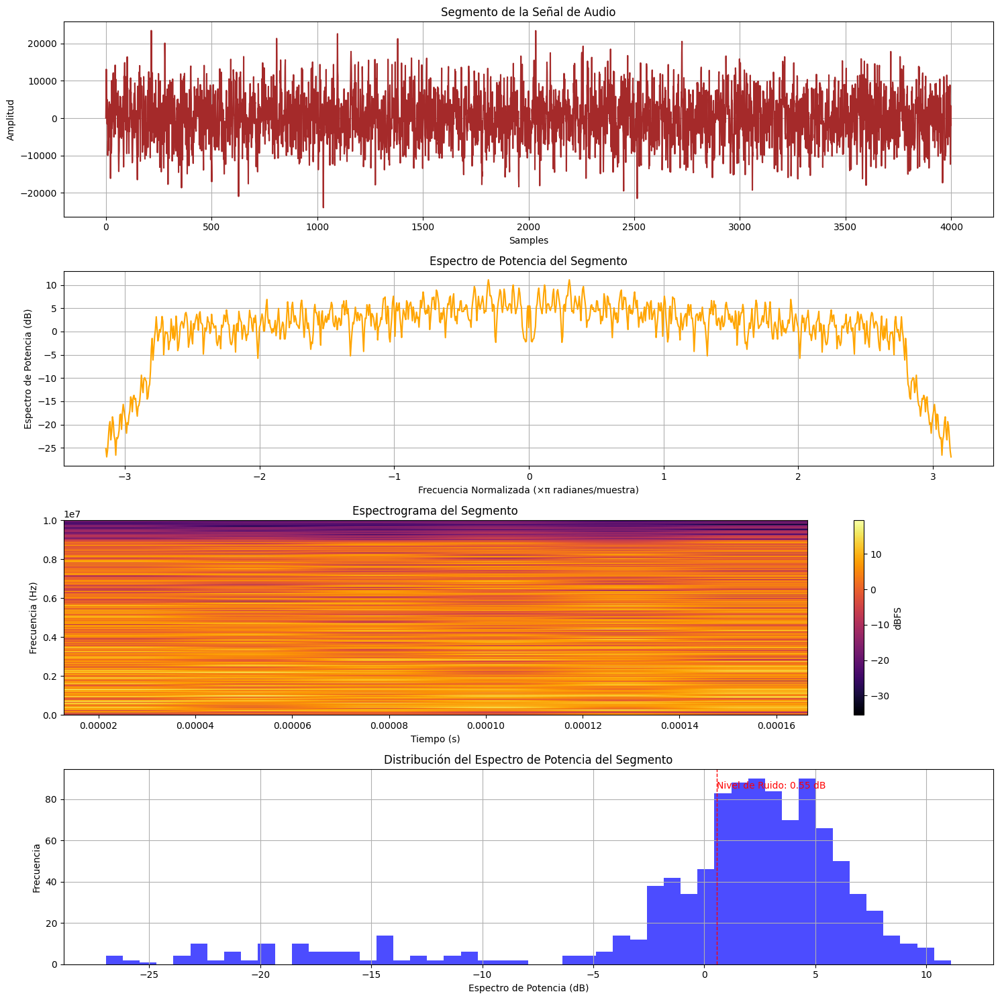

In [20]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc3_2024-07-01T19_51_03_436.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-11-c08f5ed76561>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


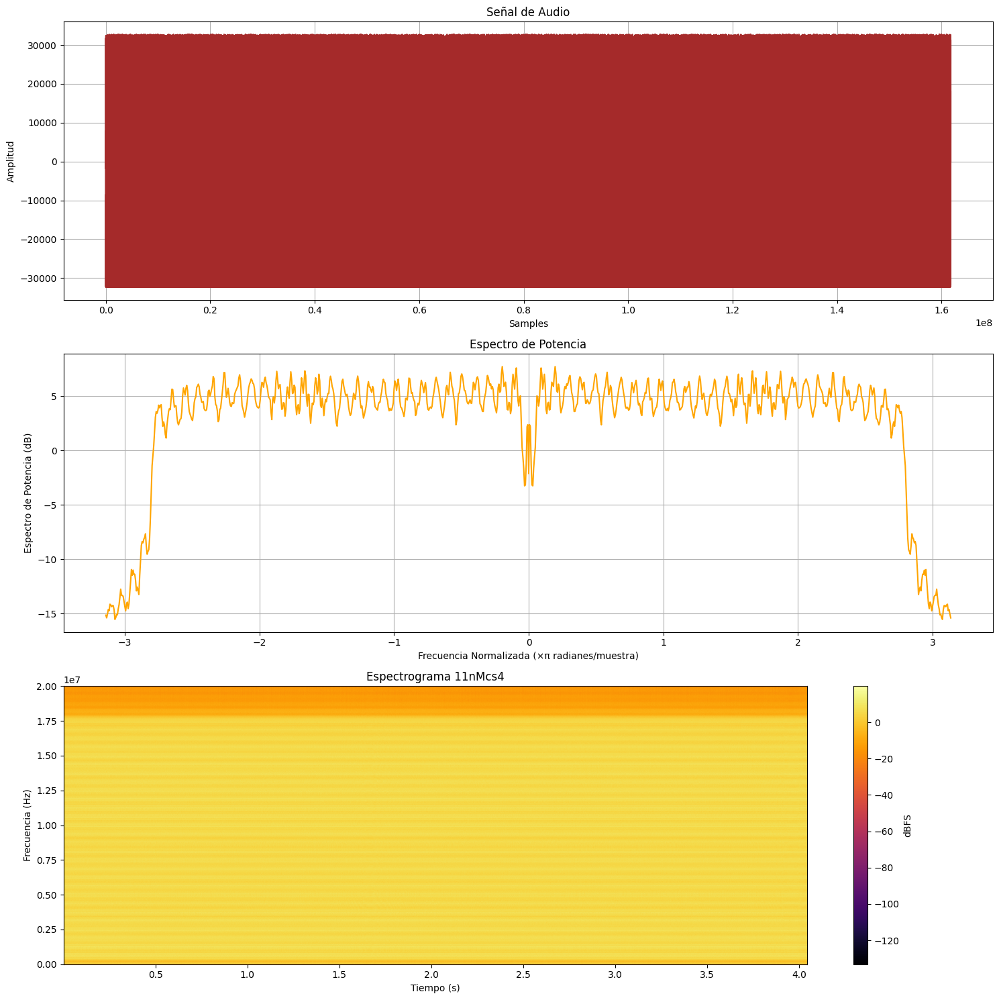

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc4_2024-07-01T19_51_22_989.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs4')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-21-a0ef6d97dcae>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


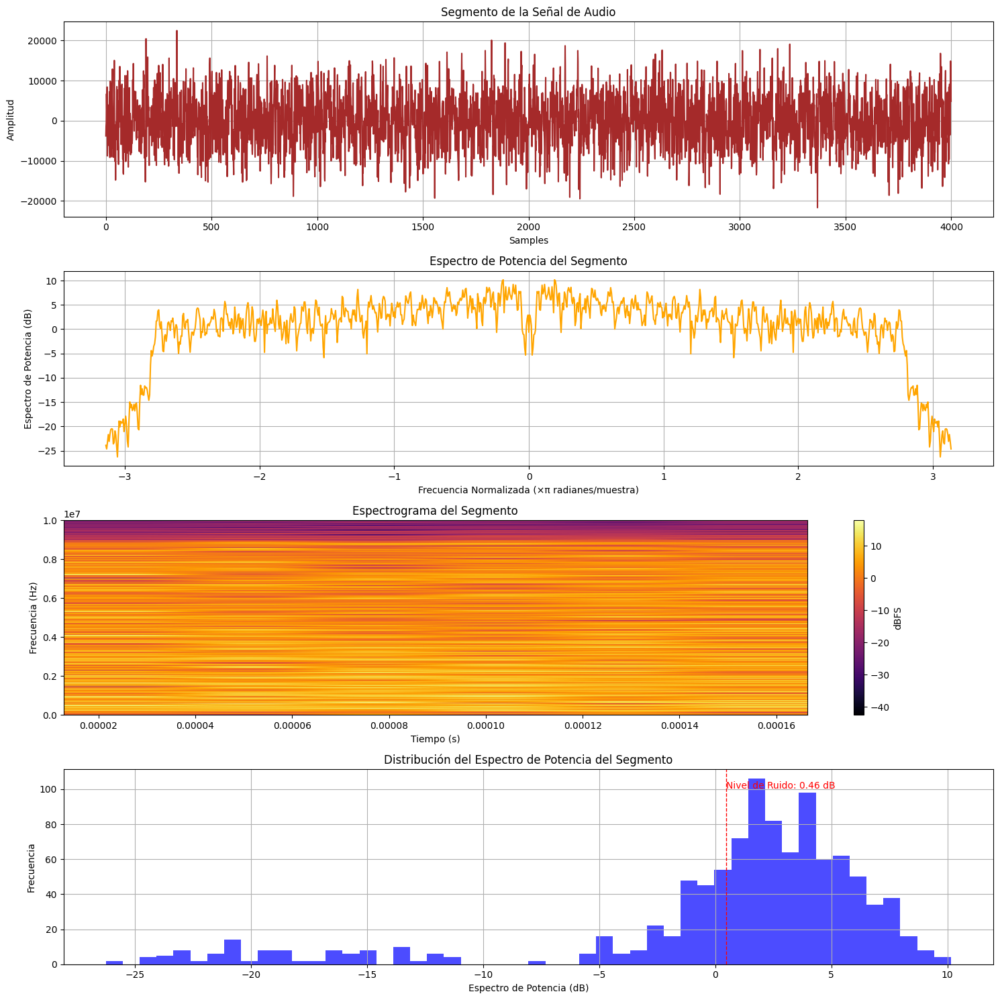

In [21]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc4_2024-07-01T19_51_22_989.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-22-28d4fa9799d2>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


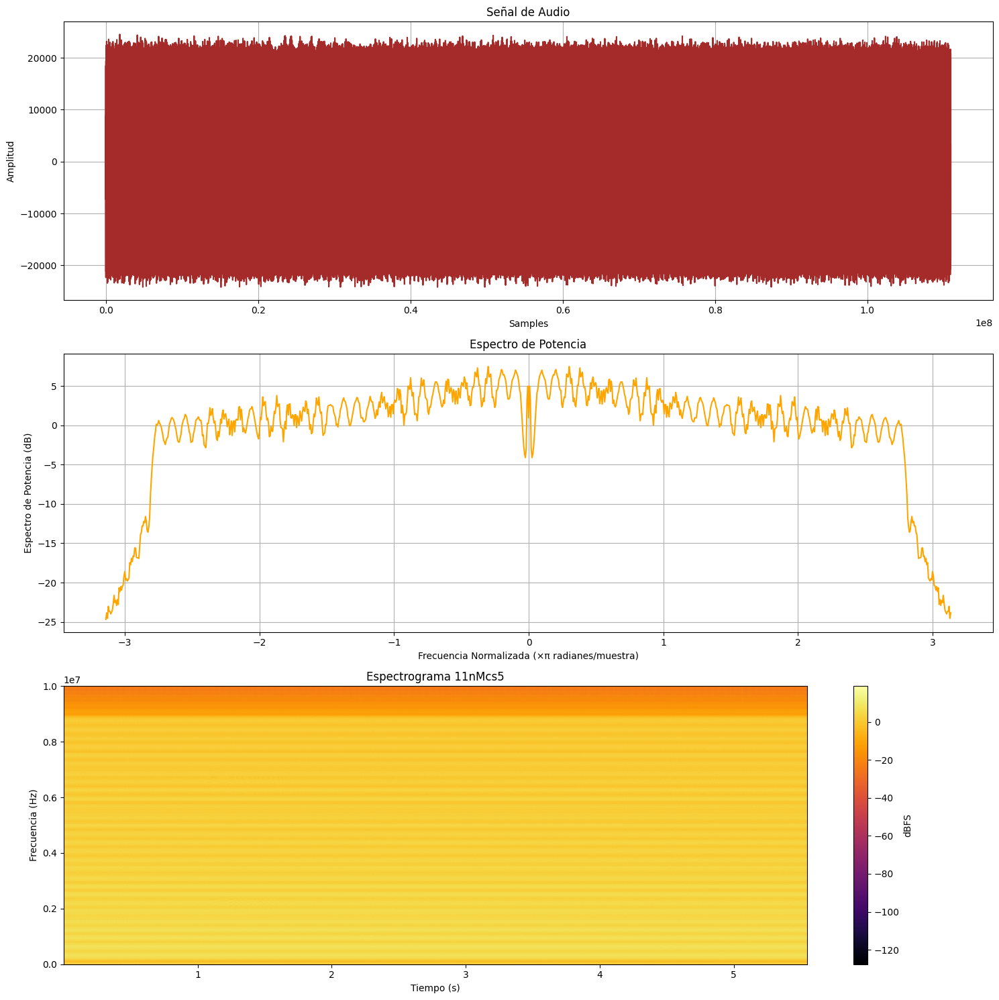

In [22]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc5_2024-07-01T19_51_43_900.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs5')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-13-228dd0280b62>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


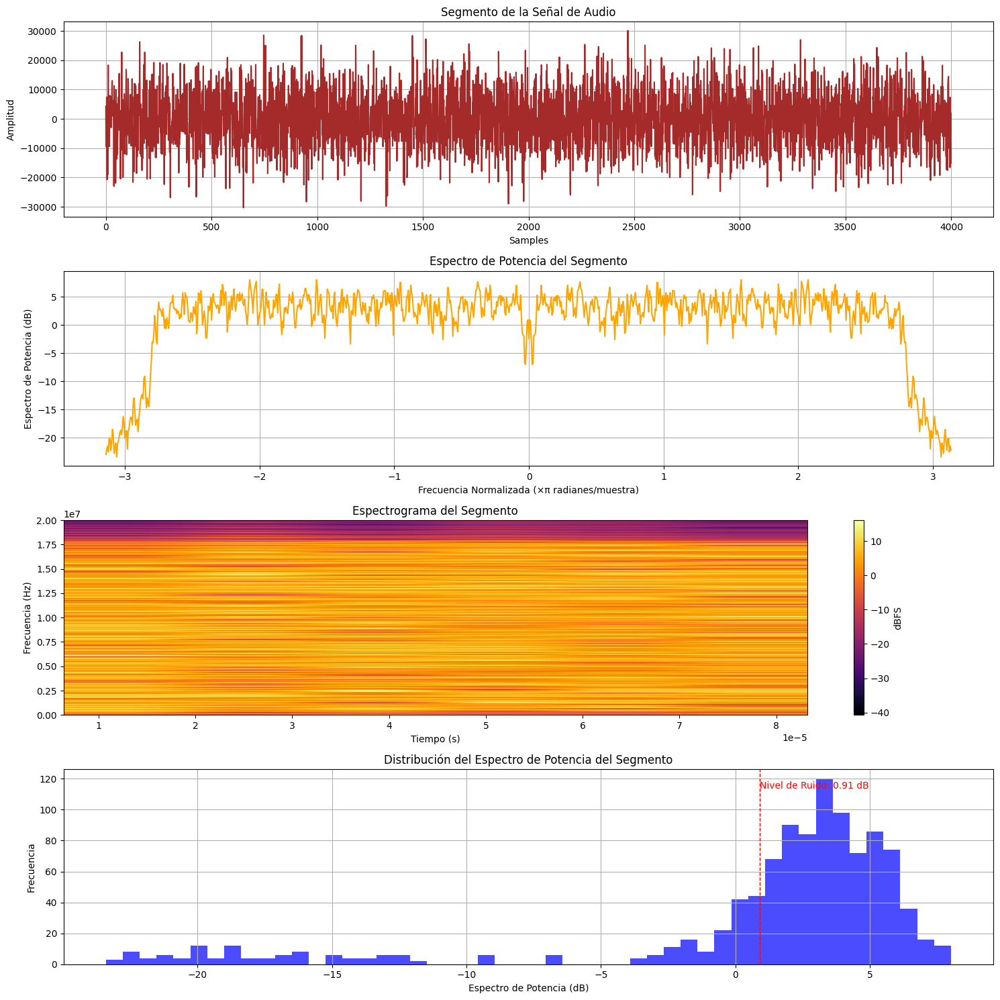

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc5_2024-07-01T19_51_43_900.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-23-ad11b2452567>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


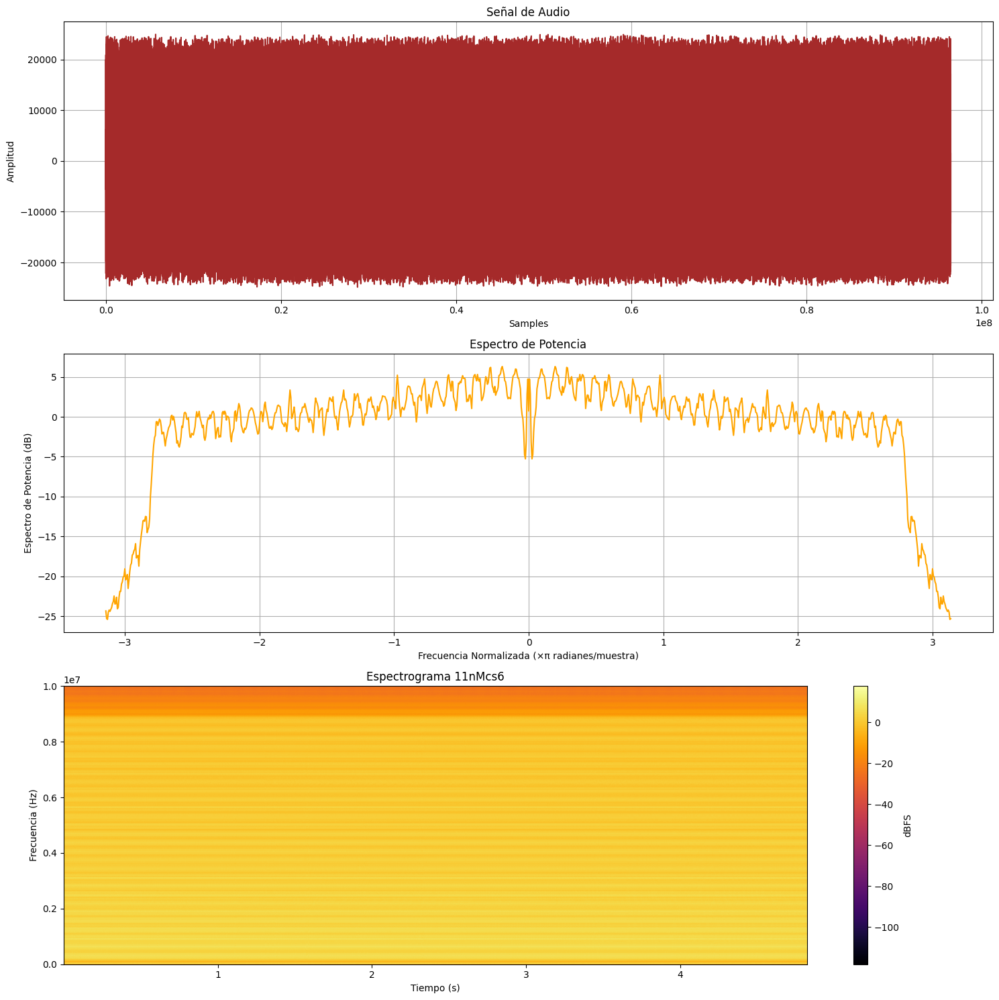

In [23]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc6_2024-07-01T19_52_23_150.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs6' )
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-24-0851cea62258>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


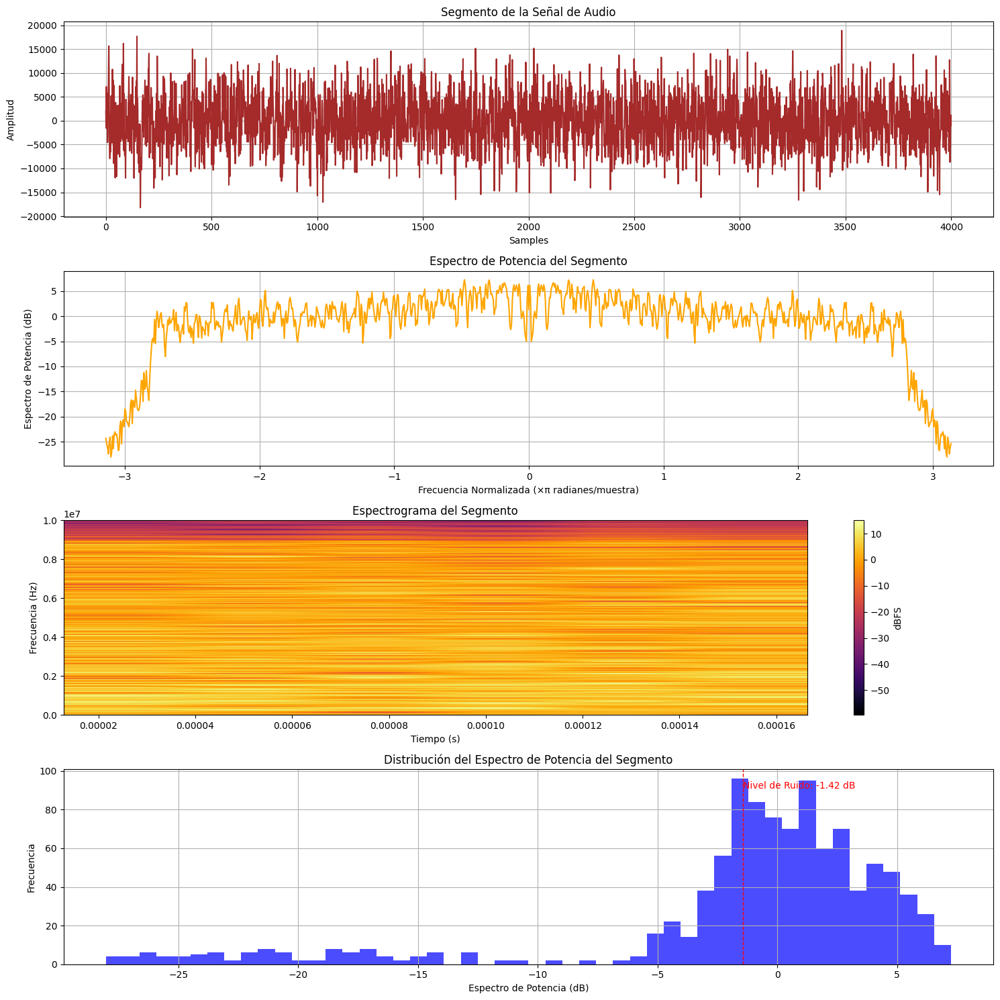

In [24]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc6_2024-07-01T19_52_23_150.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-25-d9e42fff0e41>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


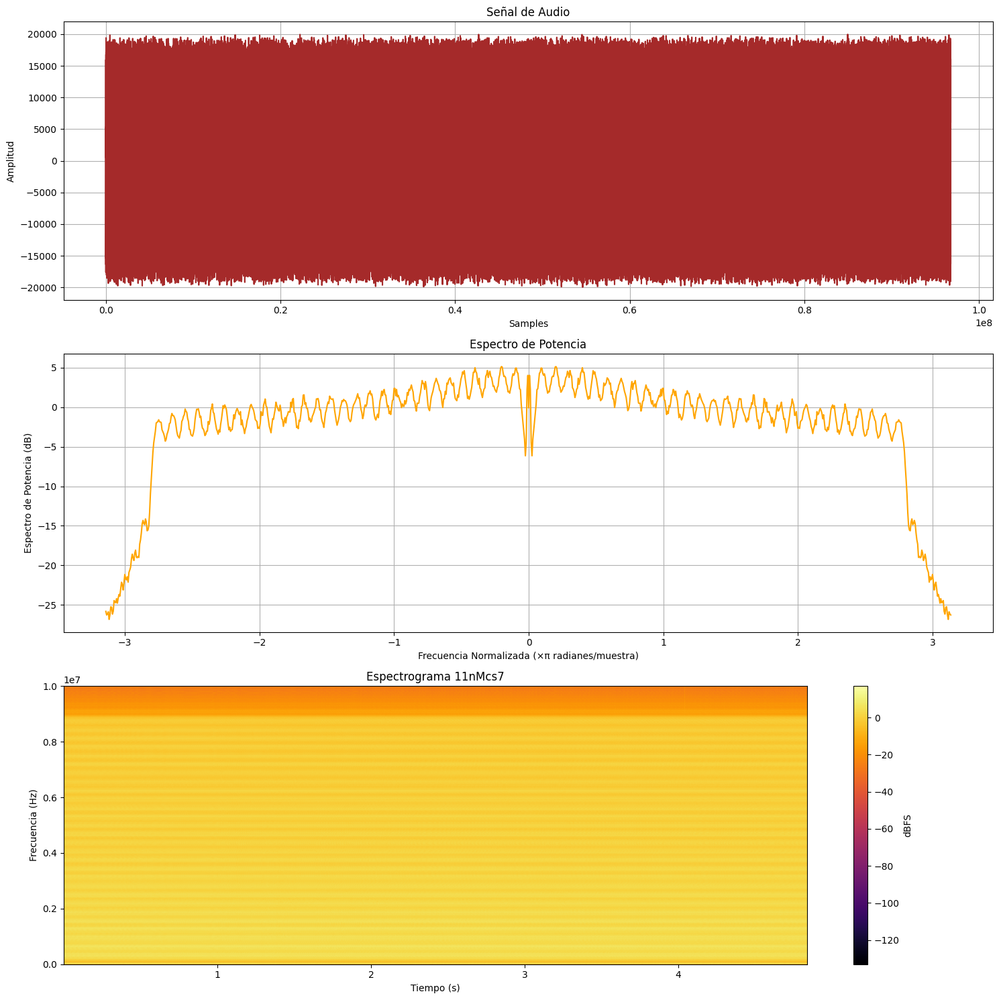

In [25]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc7_2024-07-01T19_52_42_967.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs7')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-26-c6cdd4919154>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


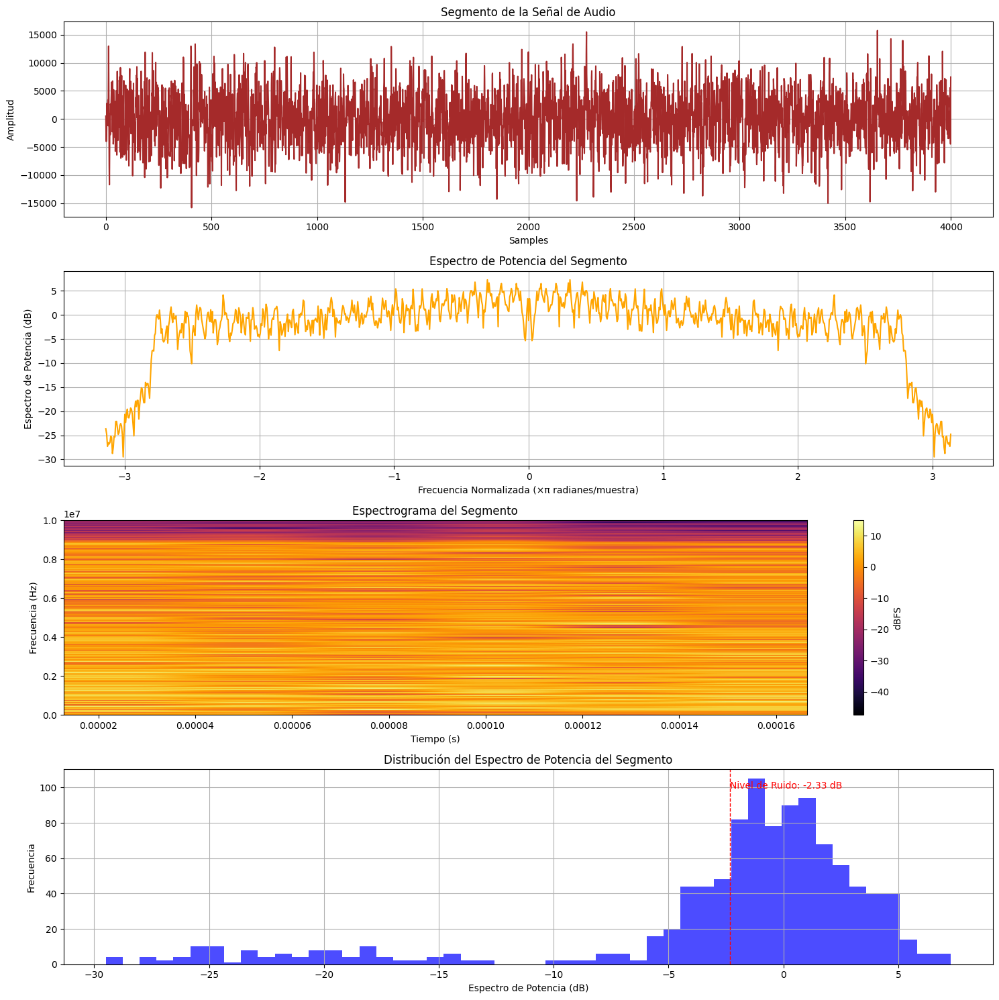

In [26]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11nMsc7_2024-07-01T19_52_42_967.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11g

<ipython-input-27-8d1ea4ded420>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


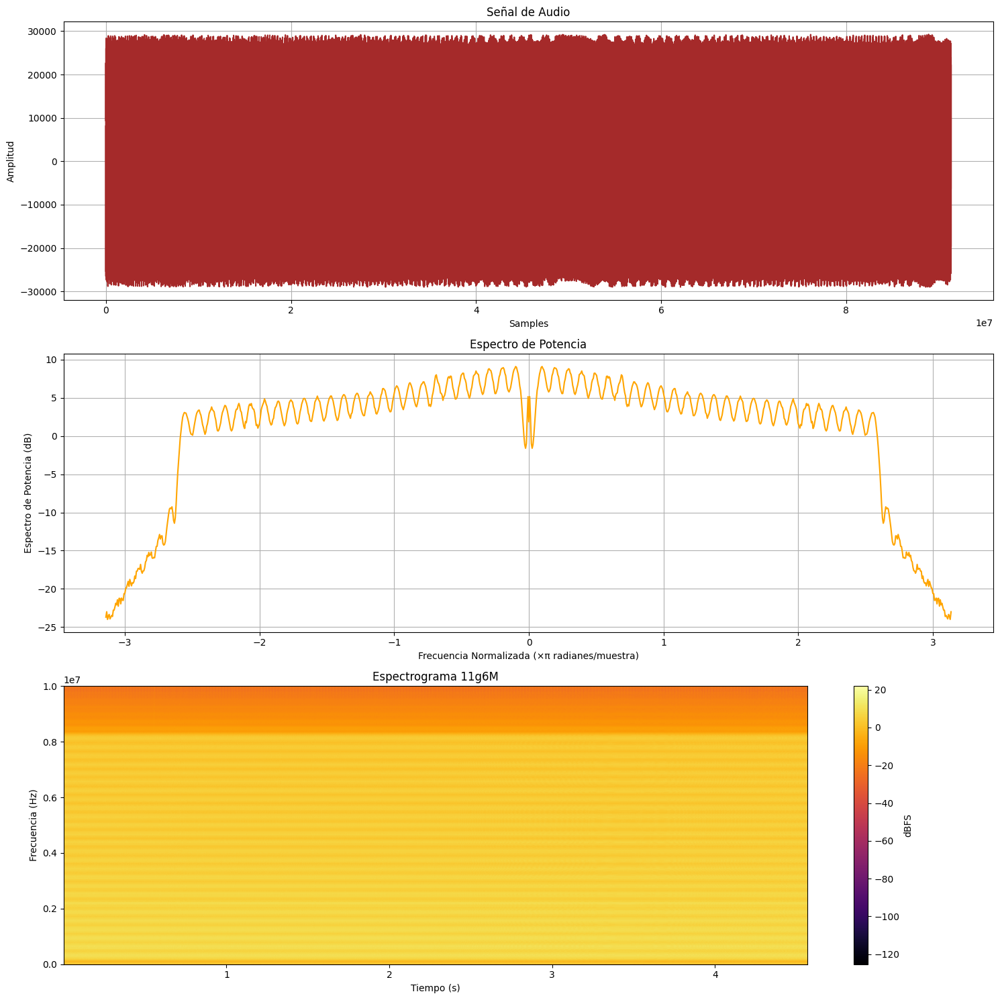

In [27]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g6M_2024-07-01T19_44_52_773.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g6M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-28-5ddaaf069abb>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


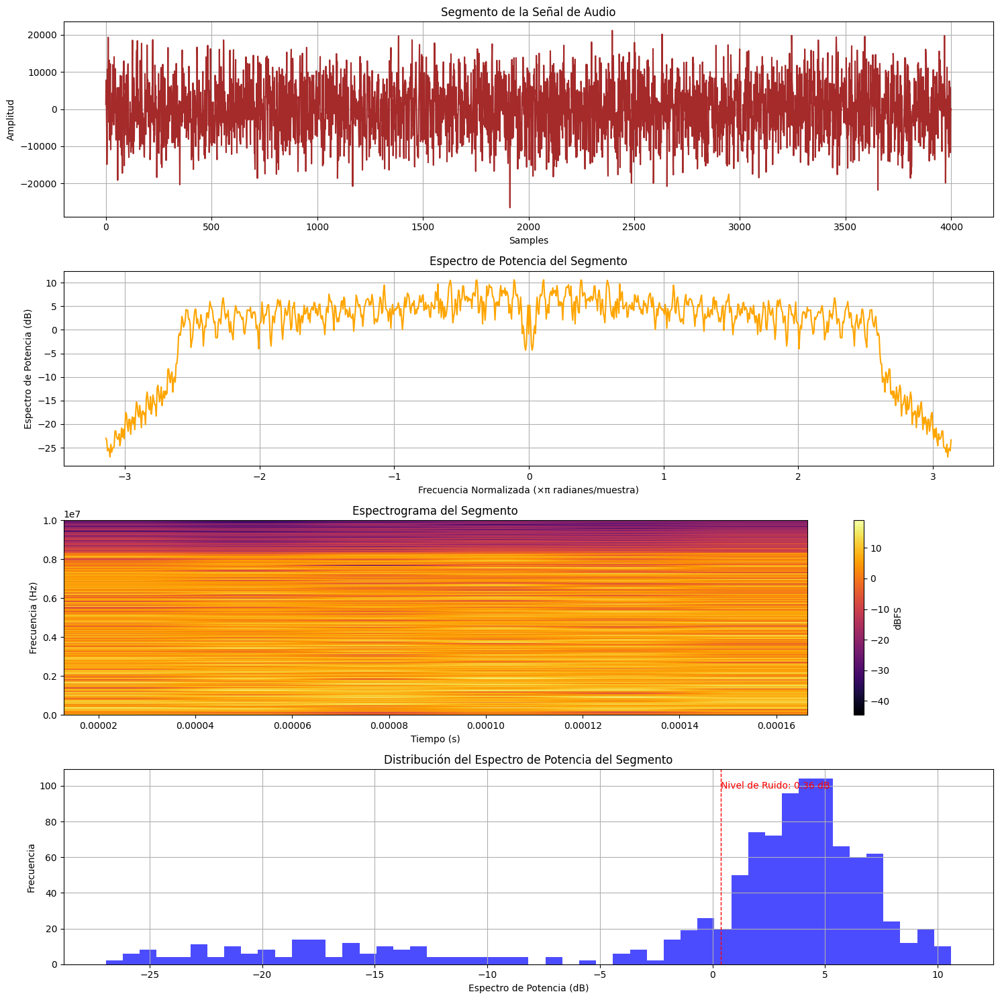

In [28]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g6M_2024-07-01T19_44_52_773.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-31-da0c63824a24>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


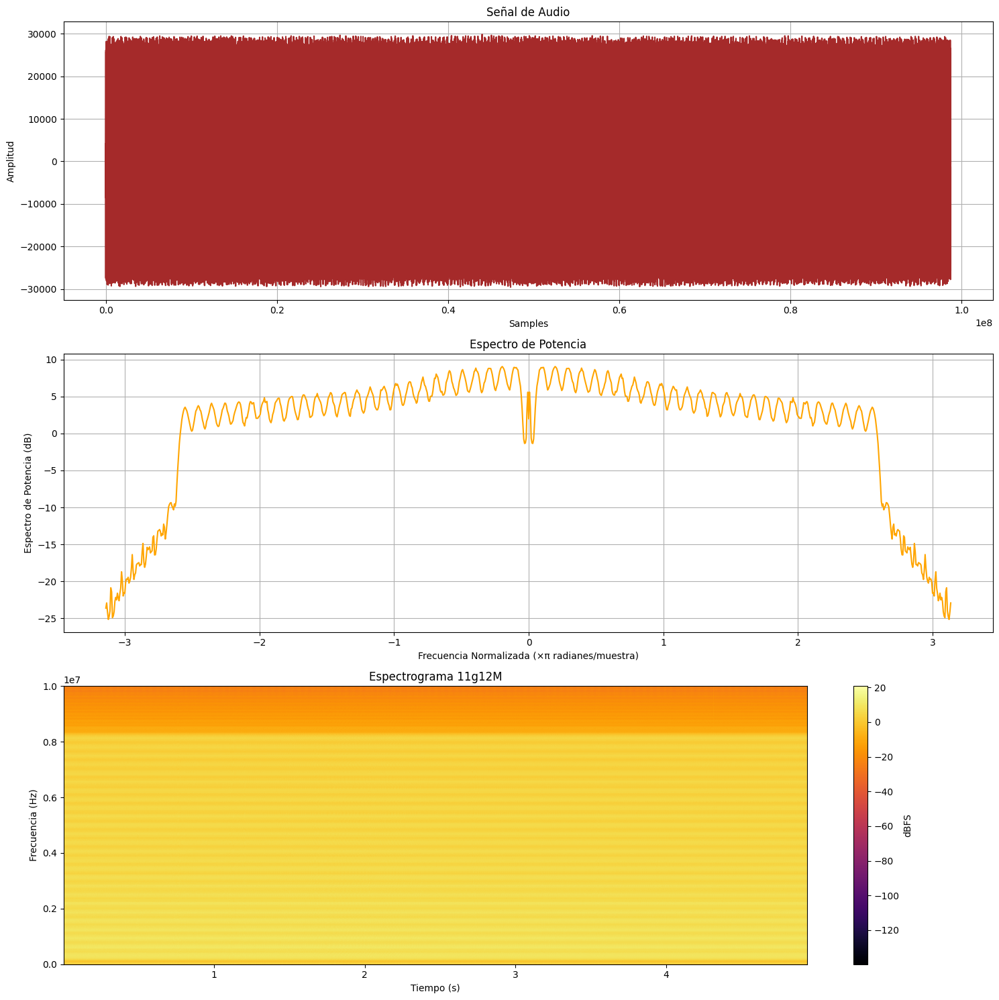

In [31]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g12M_2024-07-01T19_45_52_124.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g12M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-30-3707ab4bf836>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


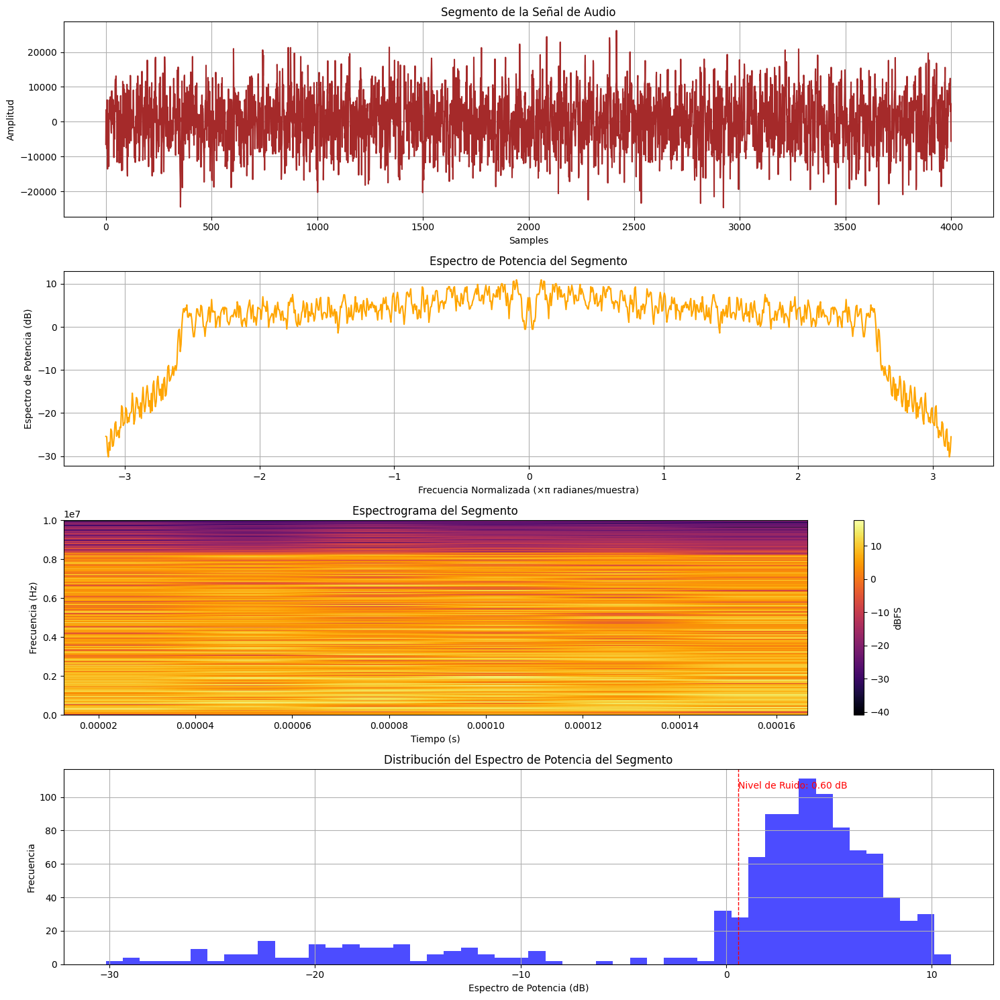

In [30]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g12M_2024-07-01T19_45_52_124.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-32-17828f3646b3>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


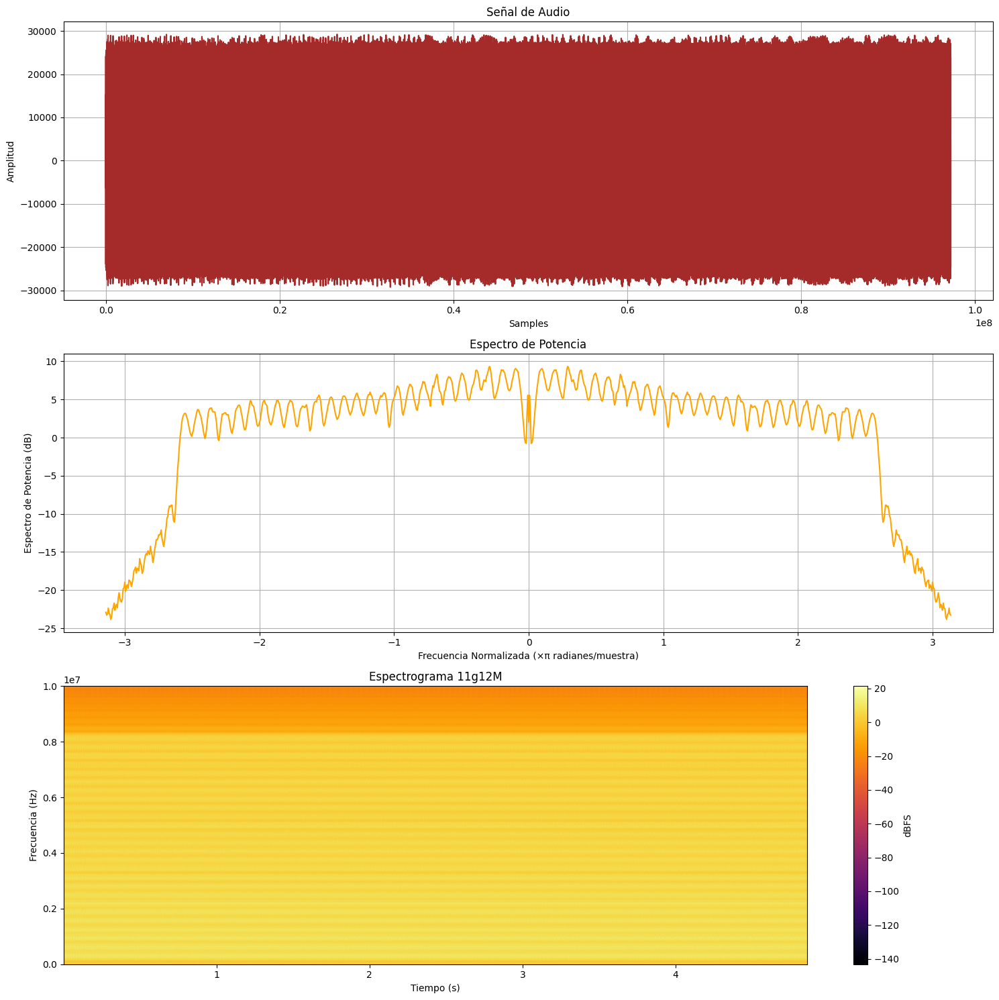

In [32]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g9M_2024-07-01T19_45_23_361.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g9M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-33-856bb1b53891>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


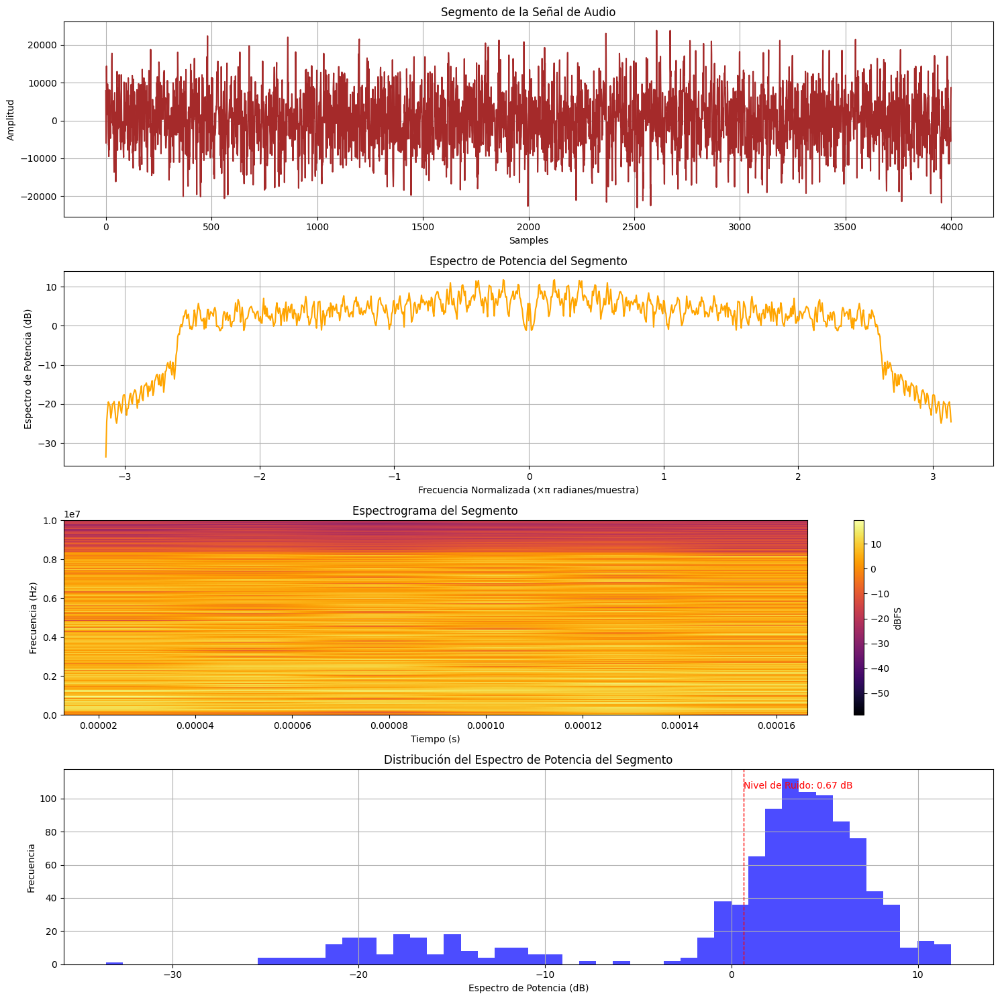

In [33]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g9M_2024-07-01T19_45_23_361.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-18-2a47f6aa3e14>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


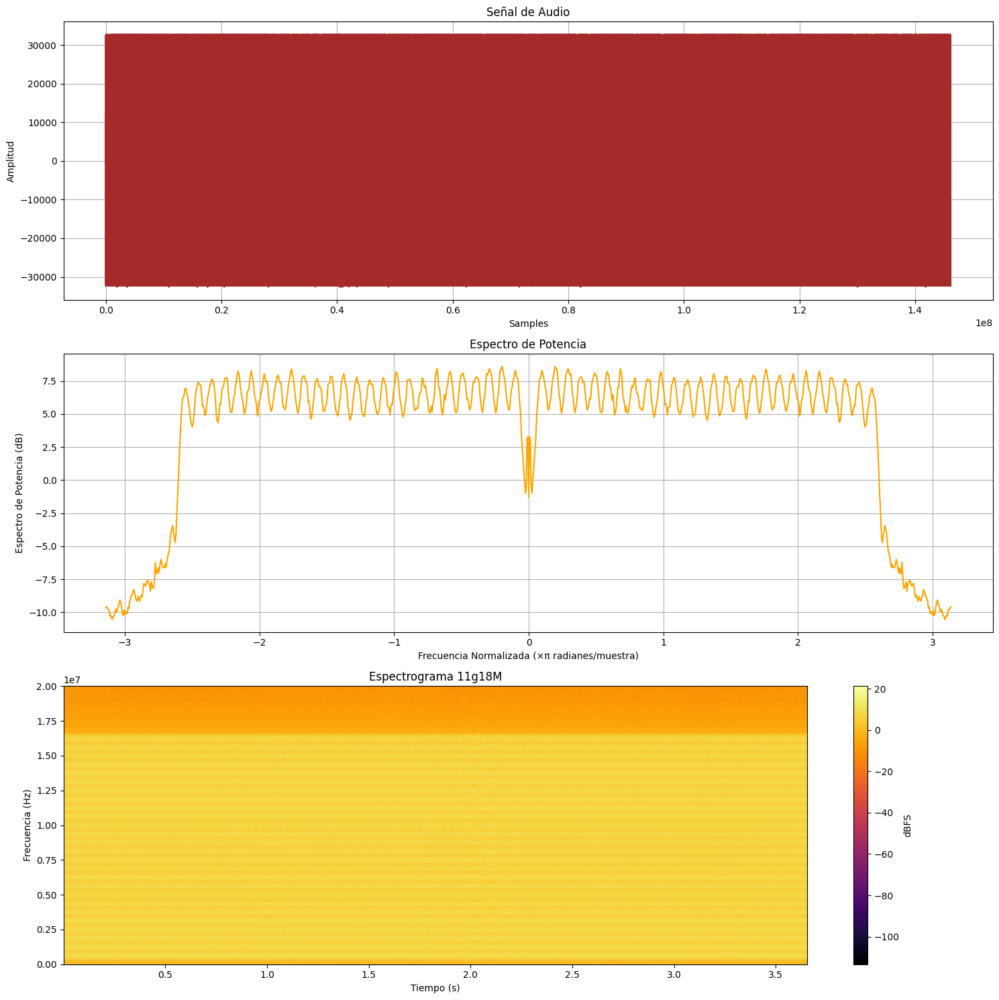

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g18M_2024-07-01T19_46_19_532.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g18M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-34-4a12f595ed14>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


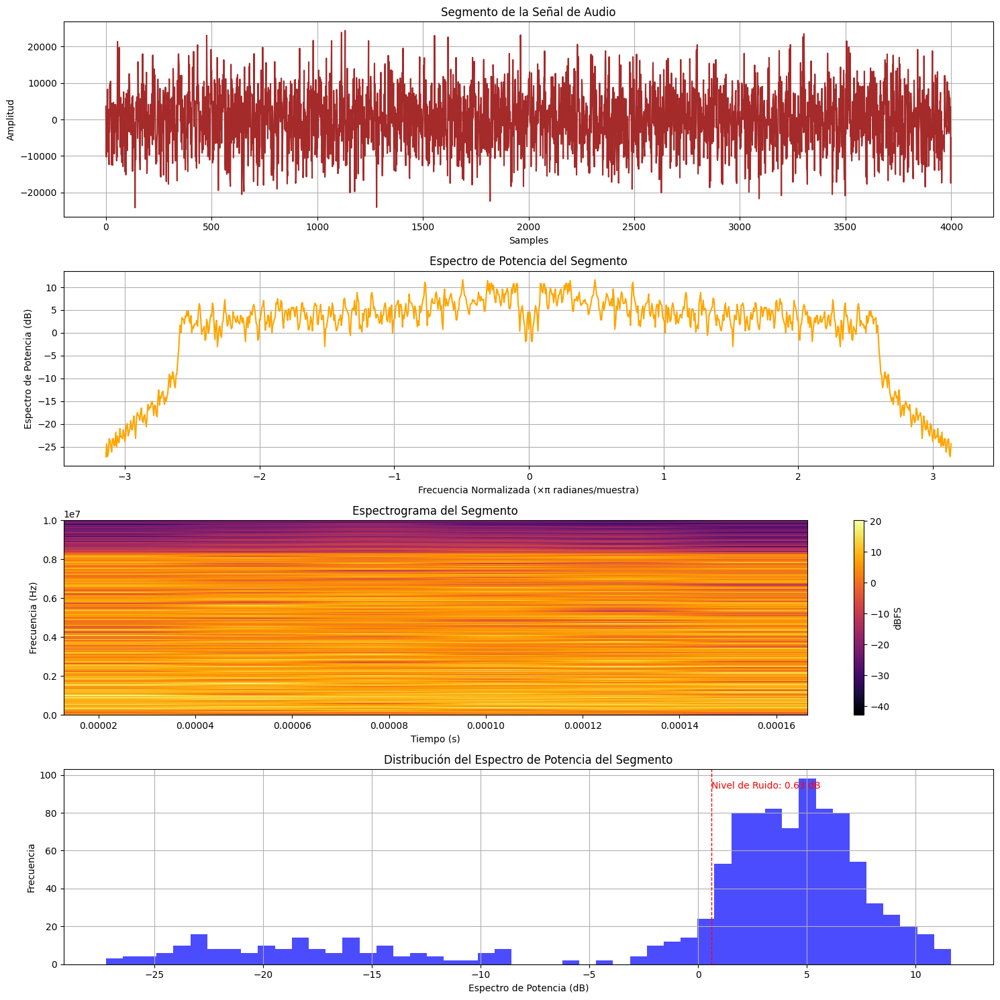

In [34]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g18M_2024-07-01T19_46_19_532.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-35-bfddbd045946>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


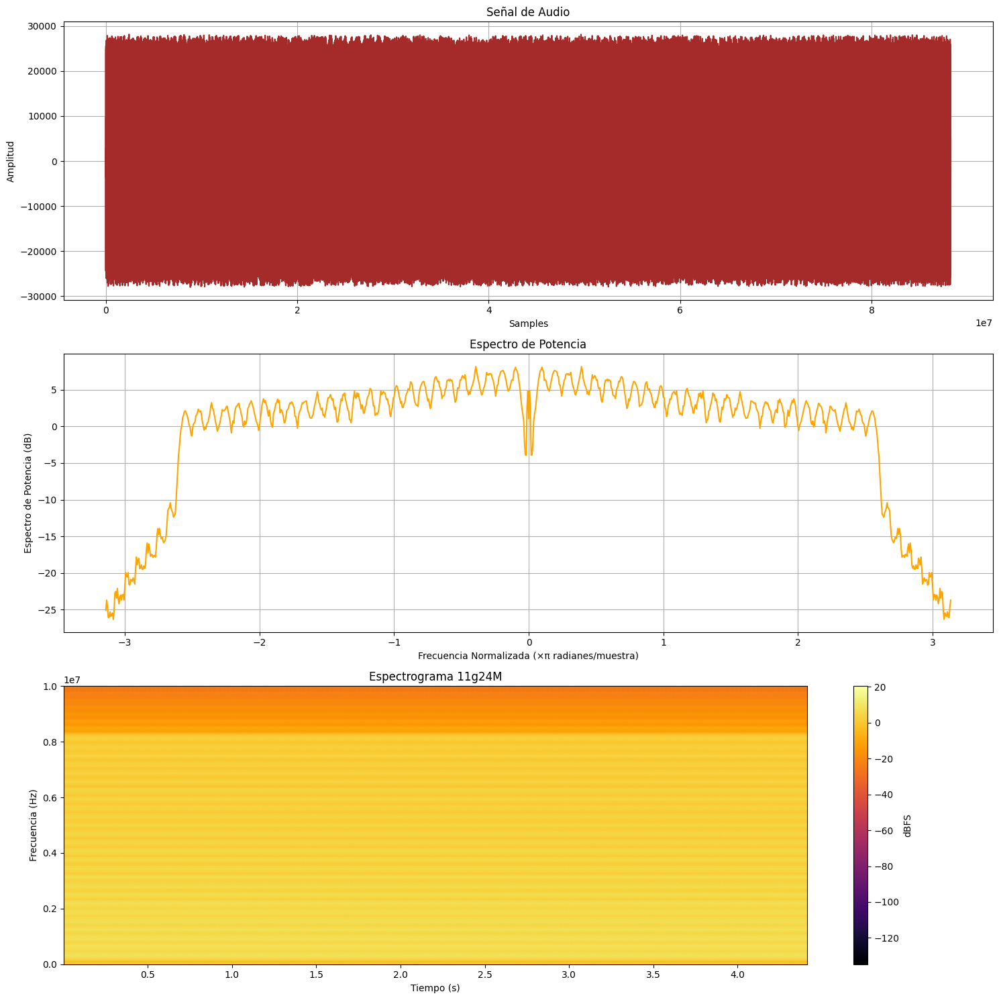

In [35]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g24M_2024-07-01T19_47_03_594.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g24M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-36-5e8ad38c868c>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


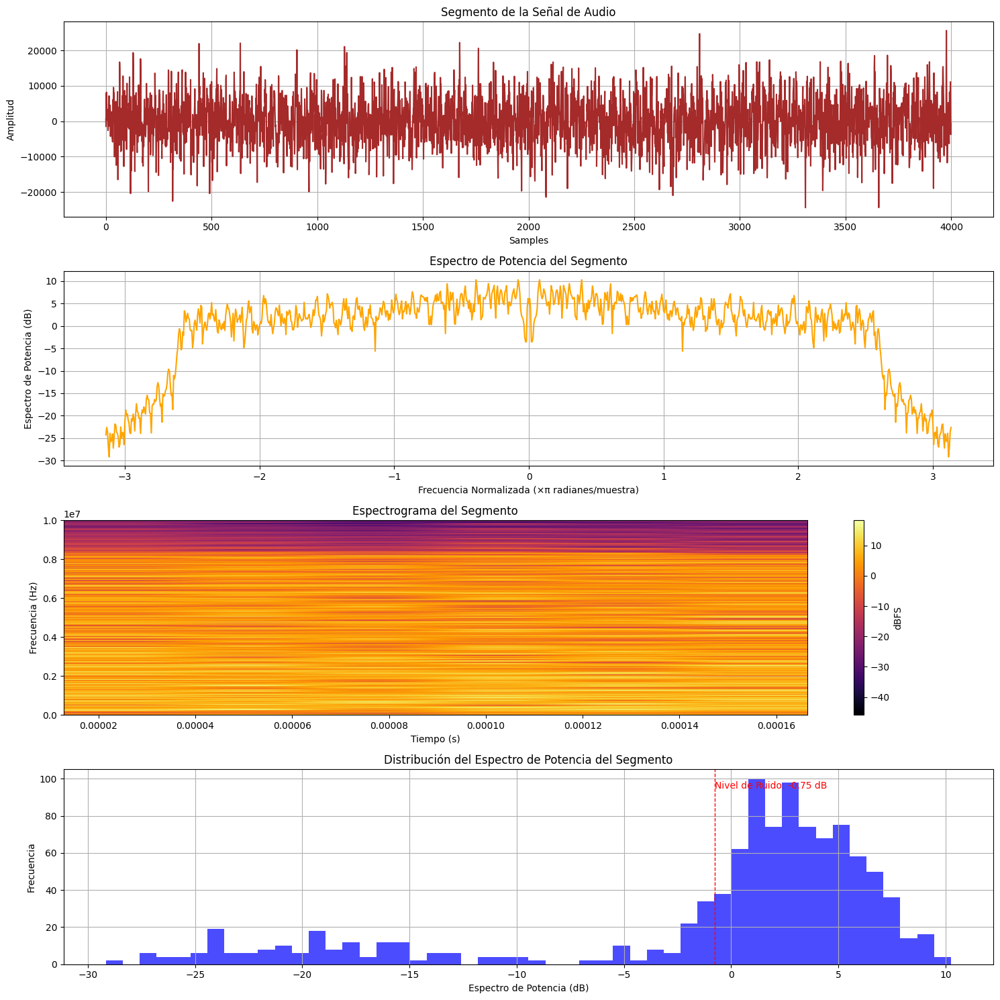

In [36]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g24M_2024-07-01T19_47_03_594.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-37-15137d188c7a>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


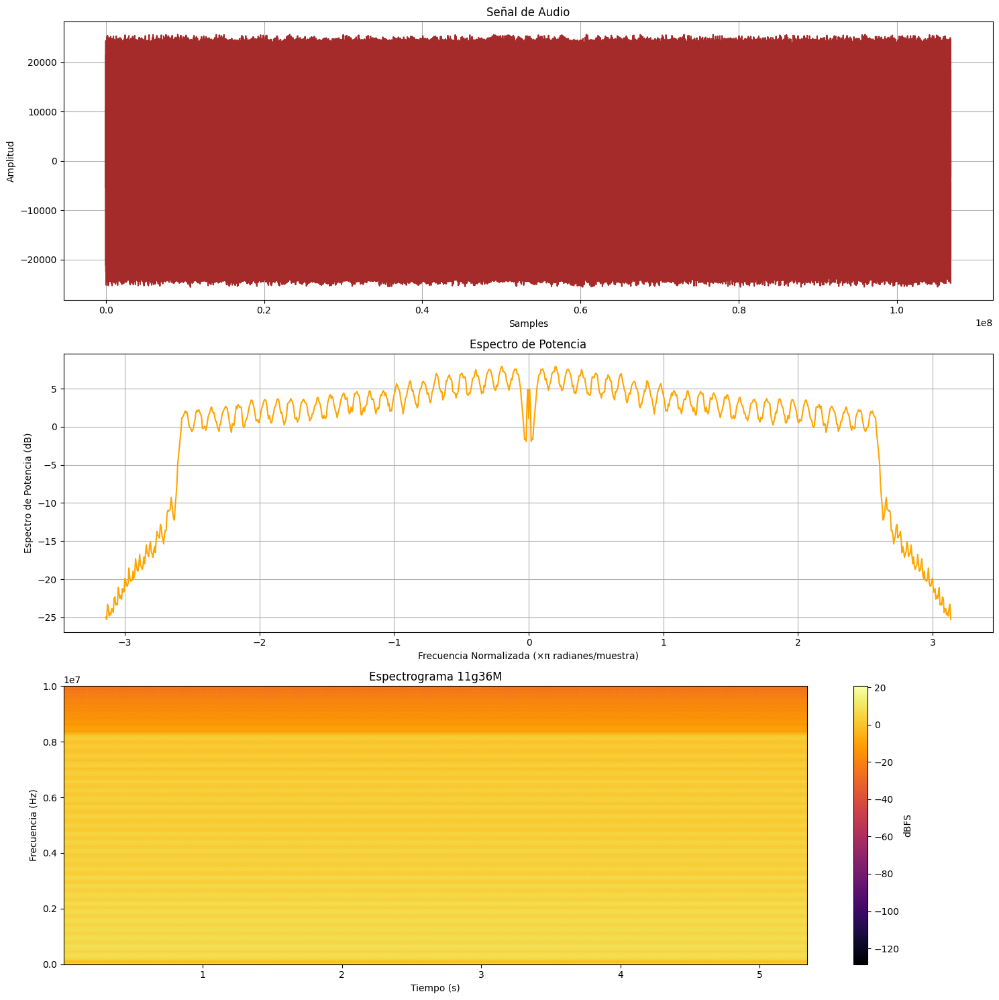

In [37]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g36M_2024-07-01T19_47_41_186.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g36M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-38-7817a2b54b2e>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


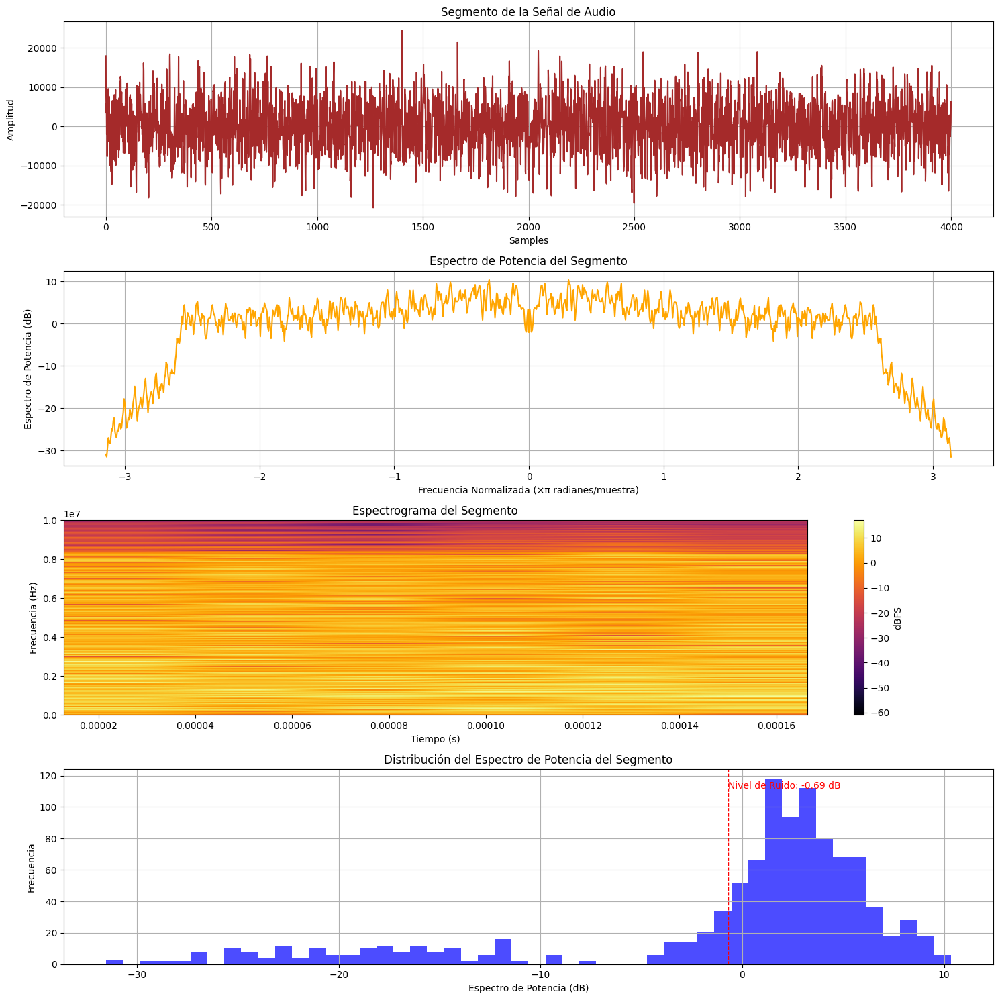

In [38]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g36M_2024-07-01T19_47_41_186.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-39-8af90bb133bc>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


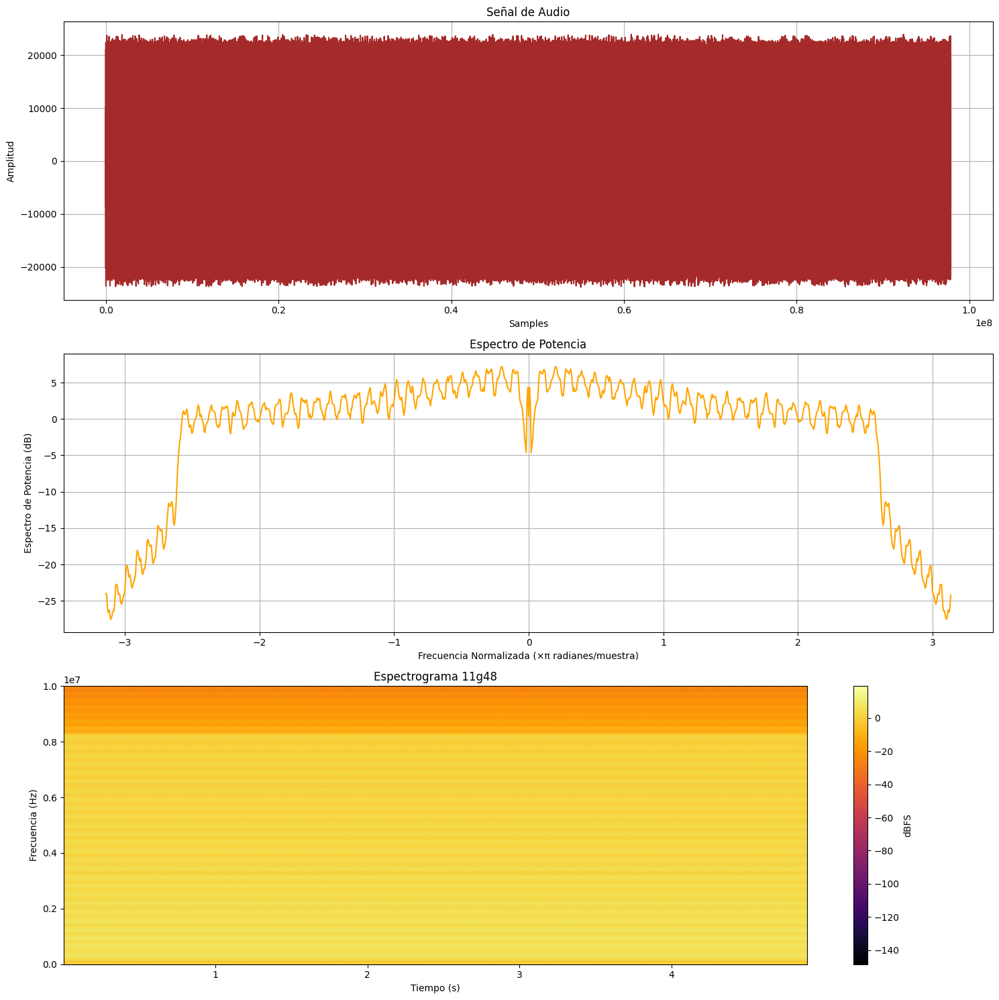

In [39]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g48M_2024-07-01T19_48_10_951.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g48')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-40-d19248260a3f>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


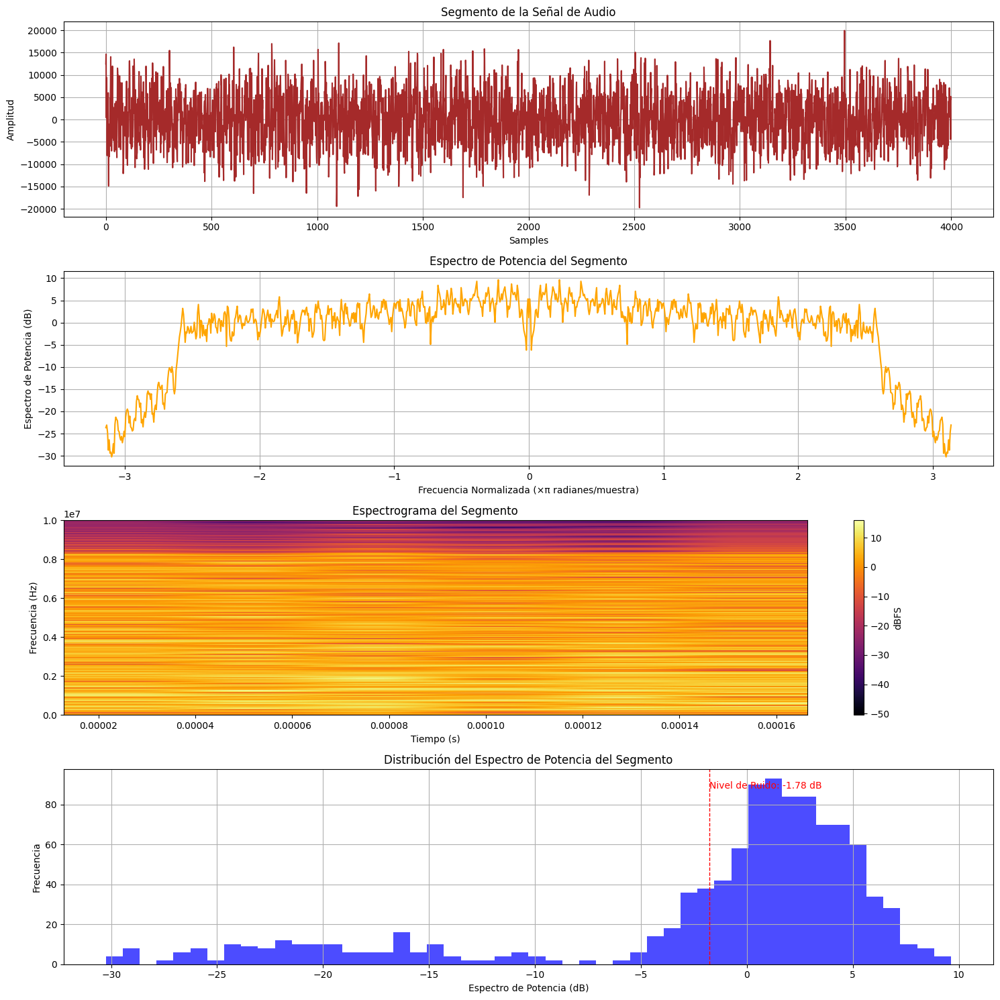

In [40]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g48M_2024-07-01T19_48_10_951.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-41-f24f2cd0907a>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


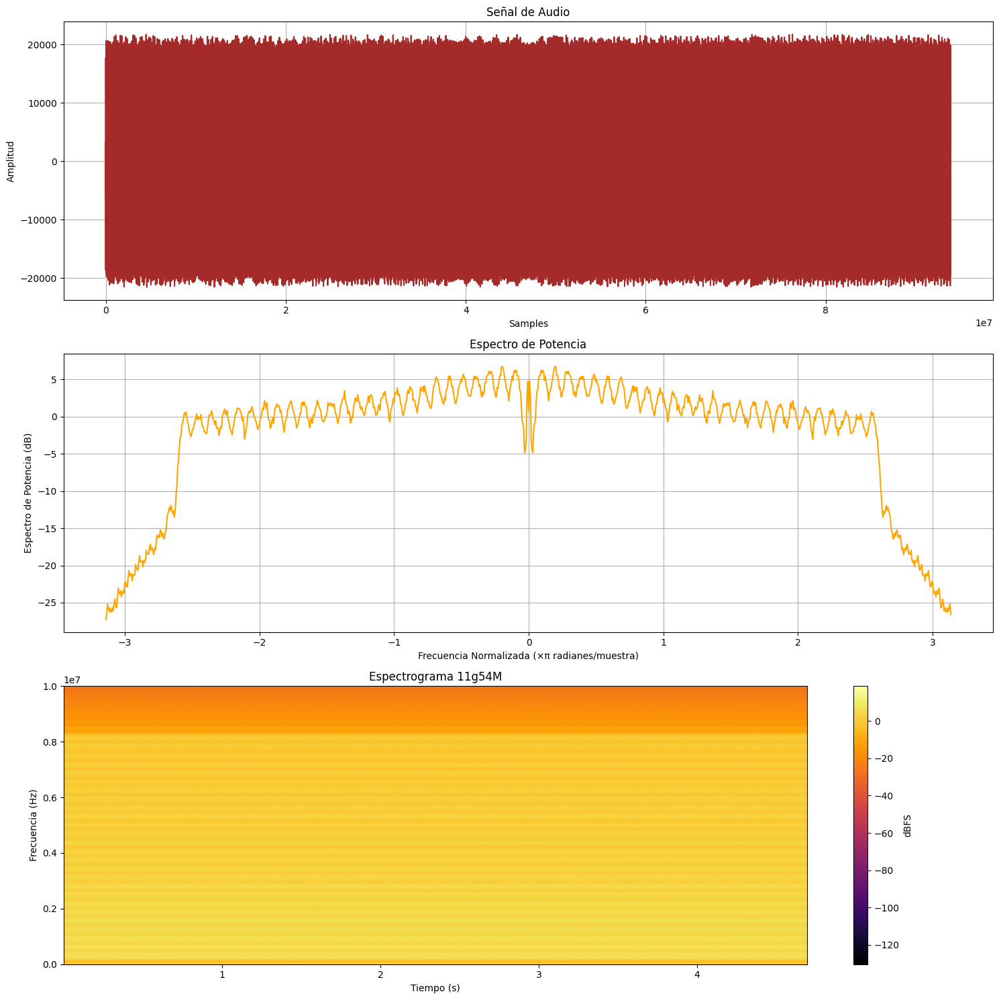

In [41]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g54M_2024-07-01T19_48_36_310.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g54M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-42-fe8b1e13bf8d>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


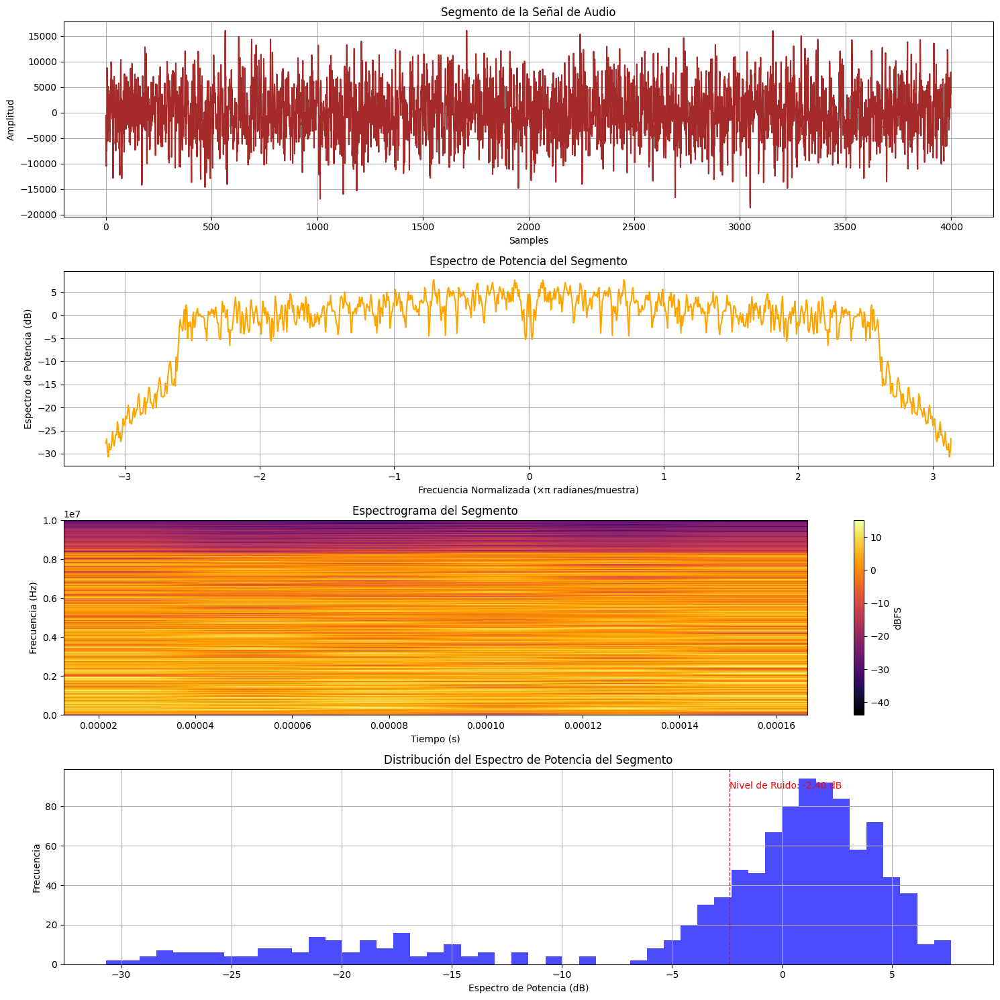

In [42]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo2SDR/11g54M_2024-07-01T19_48_36_310.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()